In this project the goal will be to create a model that classifies gym exercises from images.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os

os.chdir('/content/drive/MyDrive/Project')
print(os.getcwd())


Mounted at /content/drive
/content/drive/.shortcut-targets-by-id/1TvxgPI4igEh6xnNQWpA1rjbnEG2Cgh9L/Project


For this goal I will be using a dataset downloaded from Kaggle that has 22 different classes of gym exercises which are some of the most popular ones. First of all I'll have to load the data and apply some transformations for data augmentation.

In [ ]:
from torchvision import transforms

image_transforms = transforms.Compose([
  transforms.RandomHorizontalFlip(), # simulate different viewpoints
#   transforms.RandomVerticalFlip(),
#   transforms.RandomRotation(45),
  transforms.ColorJitter(brightness=0, contrast=0.3, saturation=0.3, hue=0.2), # simulate different lighting conditions
  transforms.ToTensor(), # convert the object into a tensor
  transforms.Resize((128, 128)), # resize the images
  transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
    #Normalizing the data to be zero-centered.
  #Initially I normalized it by using the
  #dataset mean and std, but I later changed it
  #to use the ImageNet normalization,
  #so that i can use the same data if i try
  #fine-tuning a model.
  ])

In comments near the transformation I have written why I chose them, but I didn't choose the 2 commented transformations, because:
1 - The vertical flip doesn't make sense in this context. Nobody would film themselves training upside down.

2 - Rotating the camera angle also isn't applicable in this context because when people film themselves they normally either ask someone to film them or use a tripod. In both cases the camera is stable and is on level with the ground.

In [ ]:
from torchvision.datasets import ImageFolder

dataset = ImageFolder('data',
    transform=image_transforms
)

In [ ]:
from collections import Counter

print("Number of images:", len(dataset))
print("Number of classes:", len(dataset.classes))
print("Classes:", dataset.classes)

labels = [label for _, label in dataset.samples]
label_counts = Counter(labels)

total = len(dataset)
for label_idx, count in label_counts.items():
    pct = 100 * count / total
    print(f"{dataset.classes[label_idx]}: {pct:.2f}% ({count})")

Number of images: 13853
Number of classes: 22
Classes: ['barbell biceps curl', 'bench press', 'chest fly machine', 'deadlift', 'decline bench press', 'hammer curl', 'hip thrust', 'incline bench press', 'lat pulldown', 'lateral raises', 'leg extension', 'leg raises', 'plank', 'pull up', 'push up', 'romanian deadlift', 'russian twist', 'shoulder press', 'squat', 't bar row', 'tricep dips', 'tricep pushdown']
barbell biceps curl: 5.09% (705)
bench press: 4.51% (625)
chest fly machine: 3.80% (527)
deadlift: 3.83% (530)
decline bench press: 3.71% (514)
hammer curl: 3.94% (546)
hip thrust: 4.02% (557)
incline bench press: 5.26% (729)
lat pulldown: 4.66% (646)
lateral raises: 6.09% (843)
leg extension: 4.23% (586)
leg raises: 3.71% (514)
plank: 7.17% (993)
pull up: 4.44% (615)
push up: 4.34% (601)
romanian deadlift: 4.01% (555)
russian twist: 3.77% (522)
shoulder press: 3.70% (512)
squat: 5.36% (742)
t bar row: 4.82% (668)
tricep dips: 5.04% (698)
tricep pushdown: 4.51% (625)


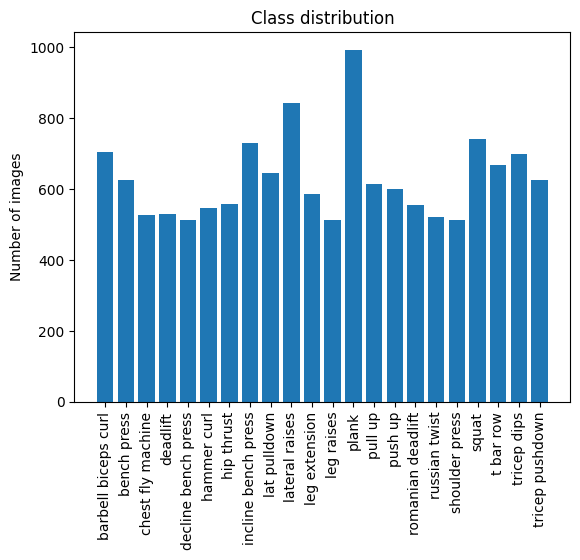

In [ ]:
import matplotlib.pyplot as plt

class_names = dataset.classes
counts = [label_counts[i] for i in range(len(class_names))]

plt.bar(class_names, counts)
plt.ylabel("Number of images")
plt.title("Class distribution")
plt.xticks(class_names, rotation=90)
plt.show()


We can see that there are some exercises with more samples like plank and lat pulldown, which could introduce bias towards them so it should be taken into account.

First of all let's split the data into a Training, Validation and Test set. They should also be stratified so that the ratio of images per category is preserved.

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split

labels = np.array([label for _, label in dataset.samples])
indices = np.arange(len(dataset))

#Dividing data into train and validation against test
#85% to 15%
train_val_idx, test_idx, y_train_val, y_test = train_test_split(
    indices,
    labels,
    test_size=0.15,
    stratify=labels,
    random_state=42
)

#Dividing train against validation so that the data becomes:
#70% train
#15% validation
#15% test

train_idx, val_idx, y_train, y_val = train_test_split(
    train_val_idx,
    y_train_val,
    test_size=15/85,
    stratify=y_train_val,
    random_state=42)

In [ ]:
from torch.utils.data import Subset

train_dataset = Subset(dataset, train_idx)
val_dataset = Subset(dataset, val_idx)
test_dataset = Subset(dataset, test_idx)

def count_labels(subset):
    labels = [dataset.samples[i][1] for i in subset.indices]
    return Counter(labels)

print("Train:", count_labels(train_dataset))
print("Val:  ", count_labels(val_dataset))
print("Test: ", count_labels(test_dataset))

Train: Counter({12: 695, 9: 590, 18: 520, 7: 511, 0: 493, 20: 488, 19: 468, 8: 452, 21: 437, 1: 437, 13: 431, 14: 421, 10: 410, 15: 389, 6: 389, 5: 382, 3: 371, 2: 369, 16: 366, 4: 360, 11: 360, 17: 358})
Val:   Counter({12: 149, 9: 127, 18: 111, 7: 109, 0: 106, 20: 105, 19: 100, 8: 97, 1: 94, 21: 94, 13: 92, 14: 90, 10: 88, 6: 84, 15: 83, 5: 82, 2: 79, 3: 79, 16: 78, 4: 77, 17: 77, 11: 77})
Test:  Counter({12: 149, 9: 126, 18: 111, 7: 109, 0: 106, 20: 105, 19: 100, 8: 97, 21: 94, 1: 94, 13: 92, 14: 90, 10: 88, 6: 84, 15: 83, 5: 82, 3: 80, 2: 79, 16: 78, 4: 77, 11: 77, 17: 77})


We can see that the data is stratified and is in the ratios 70/15/15 for train/val/test.

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


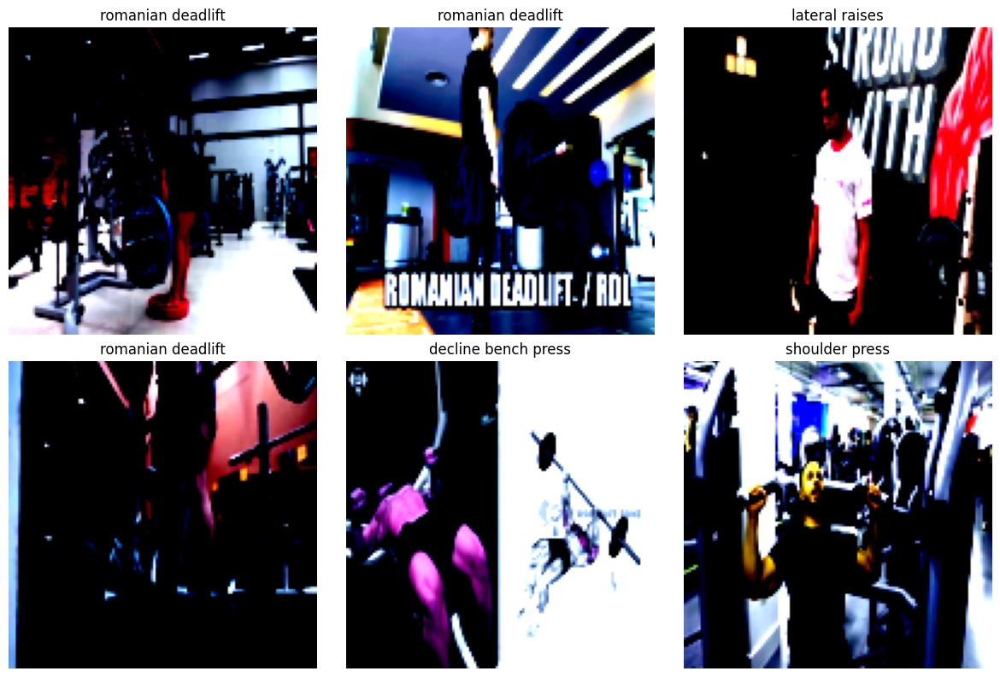

In [ ]:
from torch.utils import data

def create_dataloaders(show=True):
  batch_size = 16
  num_workers = 8 # This is used so that while the GPU trains,
  # the CPU prepares the next batch in parallel

  dataloader_train = data.DataLoader(
      train_dataset,
      shuffle=True,
      batch_size=batch_size,
      num_workers=num_workers,
      pin_memory=True
  )

  dataloader_val = data.DataLoader(
      val_dataset,
      shuffle=True,
      batch_size=batch_size,
      num_workers=num_workers,
      pin_memory=True
  )

  dataloader_test = data.DataLoader(
      test_dataset,
      shuffle=True,
      batch_size=batch_size,
      num_workers=num_workers,
      pin_memory=True
  )

  if show:

    images, labels = next(iter(dataloader_test))

    rows, cols = 2, 3
    fig, axes = plt.subplots(rows, cols, figsize=(12, 8))

    for i, ax in enumerate(axes.flat):
        image = images[i].permute(1, 2, 0)
        label_idx = labels[i].item()
        label_name = class_names[label_idx]

        ax.imshow(image)
        ax.set_title(label_name)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

  return dataloader_train, dataloader_val, dataloader_test

dataloader_train, dataloader_val, dataloader_test = create_dataloaders()



Now that we have the dataloaders set up we can start thinking about the model.

The following next blocks of code are needed to make the model run on GPU if available. This is done so that the training process is faster.

In [ ]:
import torch

print(torch.cuda.is_available())
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")


True
1
Tesla T4


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# device = torch.device("cpu")
print("Using device:", device)


Using device: cuda


100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


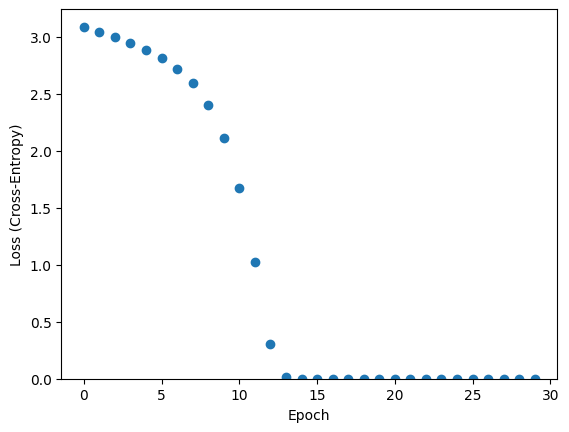

Total time taken to train the model in seconds: 13.461572408676147


In [ ]:
import VGGNet
import torch.optim as optim
import time
import pprint
import importlib
import train_model

importlib.reload(VGGNet)
importlib.reload(train_model)


subset_indices = np.random.choice(len(train_dataset), size=1, replace=False)
debug_train = Subset(train_dataset, subset_indices)

dataloader_debug = data.DataLoader(
    debug_train,
    batch_size=16,
    shuffle=True,
    num_workers=num_workers,
    pin_memory=True
)

net = VGGNet.VGGNet().to(device)
learning_rate = 5e-5
optimizer = optim.AdamW(net.parameters(), lr = learning_rate)

start_time = time.time()
# loss_history = train_model.train_model(dataloader_train, [], optimizer, net, 1, device, True)
loss_history = train_model.train_model(dataloader_debug, [], optimizer, net, 30, device, True)
end_time = time.time()

total_time_taken = end_time - start_time
print(f"Total time taken to train the model in seconds: {total_time_taken}")


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


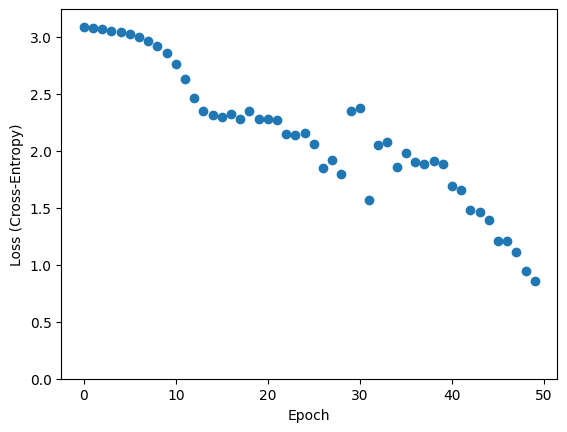

Total time taken to train the model in seconds: 34.62441873550415


In [ ]:
import VGGNet
import torch.optim as optim
import time
import pprint
import importlib
import train_model

importlib.reload(VGGNet)
importlib.reload(train_model)


subset_indices = np.random.choice(len(train_dataset), size=10, replace=False)
debug_train = Subset(train_dataset, subset_indices)

dataloader_debug = data.DataLoader(
    debug_train,
    batch_size=16,
    shuffle=True,
    num_workers=num_workers,
    pin_memory=True
)

net = VGGNet.VGGNet().to(device)
learning_rate = 5e-5
optimizer = optim.AdamW(net.parameters(), lr = learning_rate)

start_time = time.time()
# loss_history = train_model.train_model(dataloader_train, [], optimizer, net, 1, device, True)
loss_history = train_model.train_model(dataloader_debug, [], optimizer, net, 50, device, True)
end_time = time.time()

total_time_taken = end_time - start_time
print(f"Total time taken to train the model in seconds: {total_time_taken}")


The previous 2 blocks of code had the goal to overfit 1 and 10 samples to see if the model could train properly and to find the correct learning rate.

  0%|          | 0/607 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
100%|██████████| 607/607 [03:29<00:00,  2.89it/s]


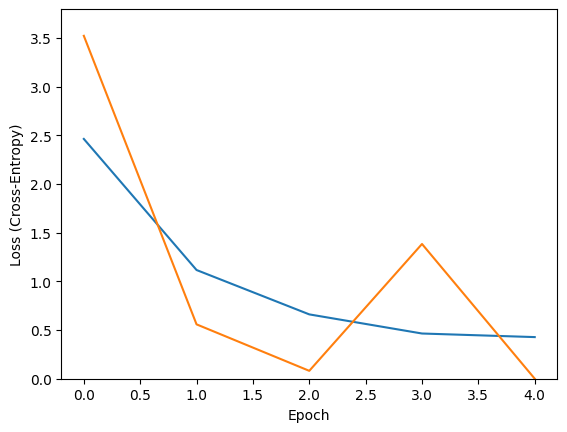

Total time taken to train the model in seconds: 1437.0726630687714


In [ ]:
import VGGNet
import torch.optim as optim
import time
import pprint
import importlib
import train_model

importlib.reload(VGGNet)
importlib.reload(train_model)


# subset_indices = np.random.choice(len(train_dataset), size=1, replace=False)
# debug_train = Subset(train_dataset, subset_indices)

# dataloader_debug = data.DataLoader(
#     debug_train,
#     batch_size=16,
#     shuffle=True,
#     num_workers=num_workers,
#     pin_memory=True
# )

net = VGGNet.VGGNet().to(device)
learning_rate = 5e-5
optimizer = optim.AdamW(net.parameters(), lr = learning_rate)

start_time = time.time()
loss_history = train_model.train_model(dataloader_train, dataloader_val, optimizer, net, 5, device, True)
# loss_history = train_model.train_model(dataloader_debug, [], optimizer, net, 30, device, True)
end_time = time.time()

total_time_taken = end_time - start_time
print(f"Total time taken to train the model in seconds: {total_time_taken}")


In [ ]:
import VGGNet
import torch.optim as optim
import time
import pprint
import importlib
import train_model

importlib.reload(VGGNet)
importlib.reload(train_model)


# subset_indices = np.random.choice(len(train_dataset), size=1, replace=False)
# debug_train = Subset(train_dataset, subset_indices)

# dataloader_debug = data.DataLoader(
#     debug_train,
#     batch_size=16,
#     shuffle=True,
#     num_workers=num_workers,
#     pin_memory=True
# )

net = VGGNet.VGGNet().to(device)
learning_rate = 5e-5
optimizer = optim.AdamW(net.parameters(), lr = learning_rate)

start_time = time.time()
loss_history = train_model.train_model(dataloader_train, dataloader_val, optimizer, net, 5, device, True)
# loss_history = train_model.train_model(dataloader_debug, [], optimizer, net, 30, device, True)
end_time = time.time()

total_time_taken = end_time - start_time
print(f"Total time taken to train the model in seconds: {total_time_taken}")


 87%|████████▋ | 528/607 [01:30<00:10,  7.40it/s]

In [ ]:
import torch
from sklearn.metrics import f1_score, precision_score, recall_score
import pprint

def print_metrics():
  all_preds = []
  all_labels = []

  net.eval()
  with torch.no_grad():
      for features, labels in dataloader_test:
          features = features.to(device)
          labels = labels.to(device)

          outputs = net(features)
          preds = torch.argmax(outputs, dim=1)

          all_preds.append(preds.cpu())
          all_labels.append(labels.cpu())

  all_preds = torch.cat(all_preds)
  all_labels = torch.cat(all_labels)

  f1 = f1_score(all_labels, all_preds, average='macro')
  precision = precision_score(all_labels, all_preds, average='macro')
  recall = recall_score(all_labels, all_preds, average='macro')

  print(f"Summary statistics:")
  print(f"Precision: {precision}")
  print(f"Recall: {recall}")
  print(f"F1: {f1}")
  print(f"Total time taken to train the model in seconds: {total_time_taken}")

  f1_per_class = f1_score(all_labels, all_preds, average=None)
  class_names = dataset.classes

  f1_dict = dict(zip(class_names, f1_per_class))

  pprint.pprint(f1_dict)



In [ ]:
print_metrics()

In [ ]:
print(np.min(loss_history))
print(loss_history[-1])
print(loss_history[0])

0.0001445904199499637
0.0001445904199499637
3.0928404331207275


This model has a 0.9 F1 score, and almost 0 loss on training data, which means that it probably can't get much better with this data.

Since I am doing this project also for personal use, I want to see if it will correctly classify images of me while training. This will add a guarantee that the model doesn't only perform well on the given dataset.

In [ ]:
def test_on_my_dataset():
  test_transforms = transforms.Compose([
    transforms.ToTensor(), # convert the object into a tensor
    transforms.Resize((128, 128)), # resize the images
    transforms.Normalize(
          mean=[0.485, 0.456, 0.406],
          std=[0.229, 0.224, 0.225]
      )
      #Normalizing the data to be zero-centered.
    #Initially I normalized it by using the
    #dataset mean and std, but I later changed it
    #to use the ImageNet normalization,
    #so that i can use the same data if i try
    #fine-tuning a model.
    ])

  my_dataset = ImageFolder('my_data',
      transform=test_transforms
  )
  my_loader = data.DataLoader(
      my_dataset,
      batch_size=8,
      shuffle=False
  )
  net.eval()
  net.to(device)

  images, _ = next(iter(my_loader))
  images = images.to(device)

  with torch.no_grad():
      outputs = net(images)
      probs = torch.softmax(outputs, dim=1)
      preds = torch.argmax(probs, dim=1)

  images = images.cpu()
  probs = probs.cpu()
  preds = preds.cpu()

  rows, cols = 2, 4
  fig, axes = plt.subplots(rows, cols, figsize=(12, 8))

  mean = torch.tensor([0.485, 0.456, 0.406])
  std = torch.tensor([0.229, 0.224, 0.225])

  for i, ax in enumerate(axes.flat):
      img = images[i].permute(1, 2, 0)
      img = img * std + mean
      img = img.clamp(0, 1)

      pred_class = class_names[preds[i]]
      confidence = probs[i][preds[i]].item()

      ax.imshow(img)
      ax.set_title(f"{pred_class} ({confidence:.2f})")
      ax.axis("off")

  plt.tight_layout()
  plt.show()

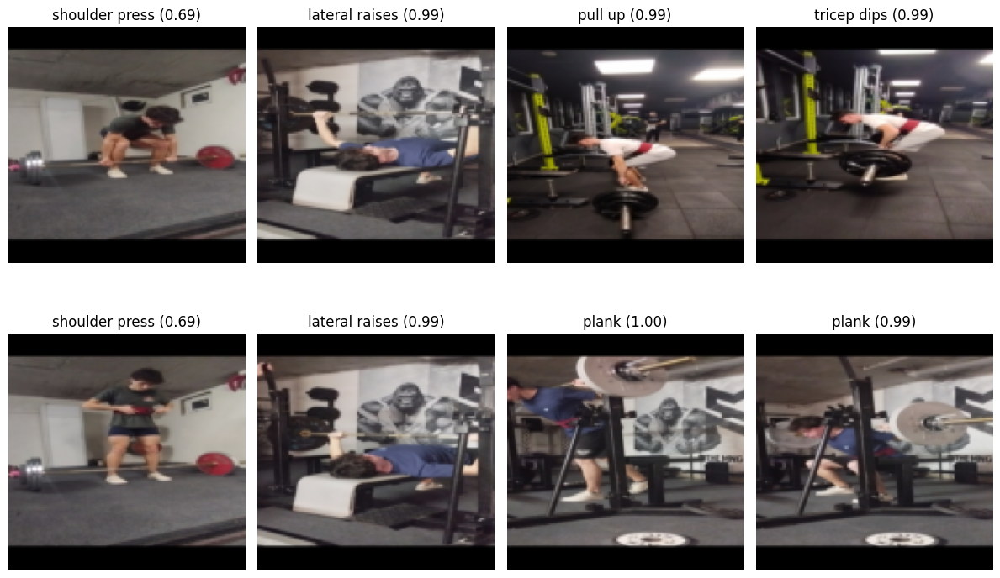

In [ ]:
test_on_my_dataset()


We didn't get the expected result. Even though the model has an F1 score of .92, the model didn't predict correctly any of my lifts. This implies that either the model has overfitted, the data isn't good enough or that the model doesn't have enough information to be able to classify them correctly. But since the VGG architecture has previously achieved great results and humans are able to distinguish the exercises based on the images, the model should be able to classify them.

After exploring the data manually, I have found that many of the images are screenshots from a single video. This is a huge problem, because I split train/val/test sets randomly and this means that 2 images that are very similar can go to train and test. This boosts the scores dramatically and gives a false evaluation. Fortunately images from the same video are near one another, so my solution is that instead of splitting at random indexes, I'll take the first 70% of images for train and so on. This guarantees that images from the same video go into the same train/val/test set.

In [ ]:
from collections import defaultdict

class_indices = defaultdict(list)

for idx, (_, label) in enumerate(dataset.samples):
    class_indices[label].append(idx)

train_idx, val_idx, test_idx = [], [], []

for label, idxs in class_indices.items():
    n = len(idxs)
    t1 = int(0.7 * n)
    t2 = int(0.85 * n)

    train_idx.extend(idxs[:t1])
    val_idx.extend(idxs[t1:t2])
    test_idx.extend(idxs[t2:])

train_dataset = Subset(dataset, train_idx)
val_dataset = Subset(dataset, val_idx)
test_dataset = Subset(dataset, test_idx)

print("Train:", count_labels(train_dataset))
print("Val:  ", count_labels(val_dataset))
print("Test: ", count_labels(test_dataset))


Train: Counter({12: 695, 9: 590, 18: 519, 7: 510, 0: 493, 20: 488, 19: 467, 8: 452, 1: 437, 21: 437, 13: 430, 14: 420, 10: 410, 6: 389, 15: 388, 5: 382, 3: 371, 2: 368, 16: 365, 4: 359, 11: 359, 17: 358})
Val:   Counter({12: 149, 9: 126, 18: 111, 7: 109, 0: 106, 20: 105, 19: 100, 8: 97, 1: 94, 21: 94, 13: 92, 14: 90, 10: 88, 6: 84, 15: 83, 5: 82, 2: 79, 3: 79, 16: 78, 4: 77, 11: 77, 17: 77})
Test:  Counter({12: 149, 9: 127, 18: 112, 7: 110, 0: 106, 20: 105, 19: 101, 8: 97, 1: 94, 21: 94, 13: 93, 14: 91, 10: 88, 6: 84, 15: 84, 5: 82, 2: 80, 3: 80, 16: 79, 4: 78, 11: 78, 17: 77})


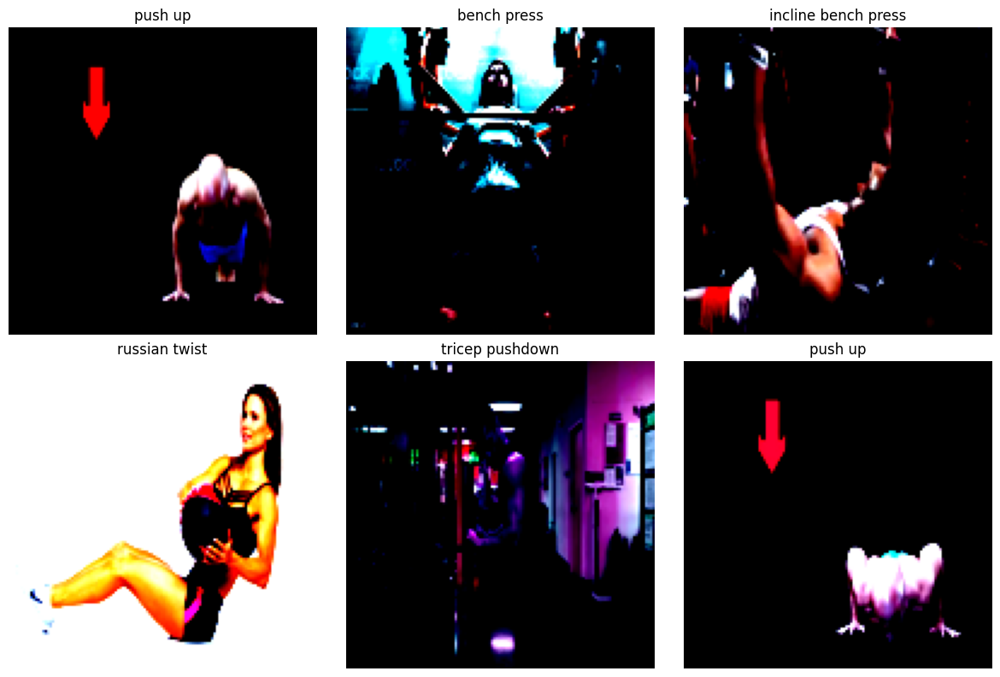

606
130
131


In [ ]:
dataloader_train, dataloader_val, dataloader_test = create_dataloaders()

print(len(dataloader_train))
print(len(dataloader_val))
print(len(dataloader_test))

In [ ]:
import torch

print(torch.cuda.is_available())
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# device = torch.device("cpu")
print("Using device:", device)



True
1
Tesla T4
Using device: cuda


100%|██████████| 606/606 [03:12<00:00,  3.15it/s]


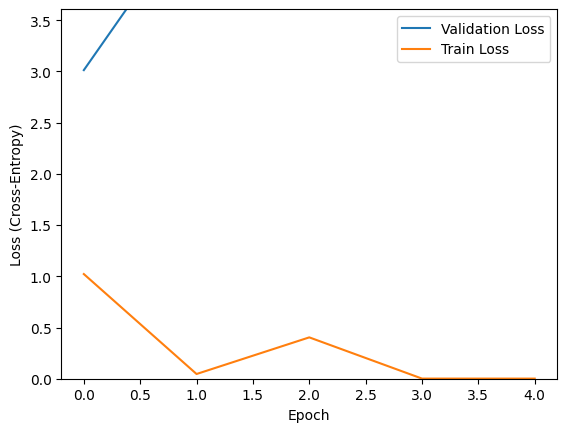

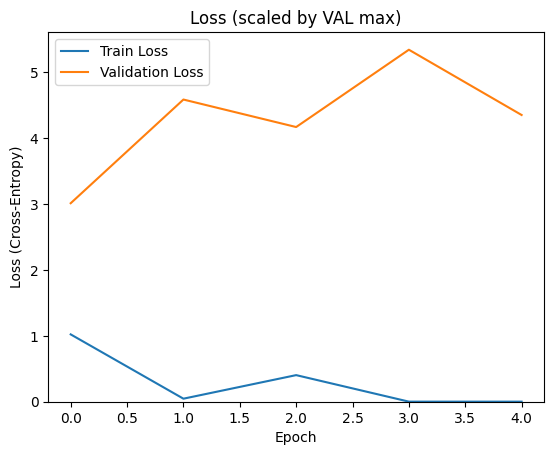

Total time taken to train the model in seconds: 2110.7331128120422


In [ ]:
import VGGNet
import torch.optim as optim
import time
import pprint
import importlib
import train_model

importlib.reload(VGGNet)
importlib.reload(train_model)


# subset_indices = np.random.choice(len(train_dataset), size=1, replace=False)
# debug_train = Subset(train_dataset, subset_indices)

# dataloader_debug = data.DataLoader(
#     debug_train,
#     batch_size=16,
#     shuffle=True,
#     num_workers=num_workers,
#     pin_memory=True
# )

net = VGGNet.VGGNet().to(device)
learning_rate = 5e-5
optimizer = optim.AdamW(net.parameters(), lr = learning_rate)

start_time = time.time()
loss_history = train_model.train_model(dataloader_train, dataloader_val, optimizer, net, 5, device, True)
# loss_history = train_model.train_model(dataloader_debug, [], optimizer, net, 30, device, True)
end_time = time.time()

total_time_taken = end_time - start_time
print(f"Total time taken to train the model in seconds: {total_time_taken}")


In [ ]:
print(np.min(loss_history))
print(loss_history[-1]
      )
print(loss_history[0])

4.8674934078007936e-05
0.001067229313775897
3.091567277908325


In [ ]:
print_metrics()

Summary statistics:
Precision: 0.3335268089935665
Recall: 0.32000396317909346
F1: 0.30425951433197984
Total time taken to train the model in seconds: 2110.7331128120422
{'barbell biceps curl': np.float64(0.18181818181818182),
 'bench press': np.float64(0.2608695652173913),
 'chest fly machine': np.float64(0.40625),
 'deadlift': np.float64(0.012903225806451613),
 'decline bench press': np.float64(0.12244897959183673),
 'hammer curl': np.float64(0.304635761589404),
 'hip thrust': np.float64(0.19047619047619047),
 'incline bench press': np.float64(0.45454545454545453),
 'lat pulldown': np.float64(0.410958904109589),
 'lateral raises': np.float64(0.367816091954023),
 'leg extension': np.float64(0.5245901639344263),
 'leg raises': np.float64(0.46153846153846156),
 'plank': np.float64(0.6374269005847953),
 'pull up': np.float64(0.3835616438356164),
 'push up': np.float64(0.4),
 'romanian deadlift': np.float64(0.16822429906542055),
 'russian twist': np.float64(0.11475409836065574),
 'shoulder

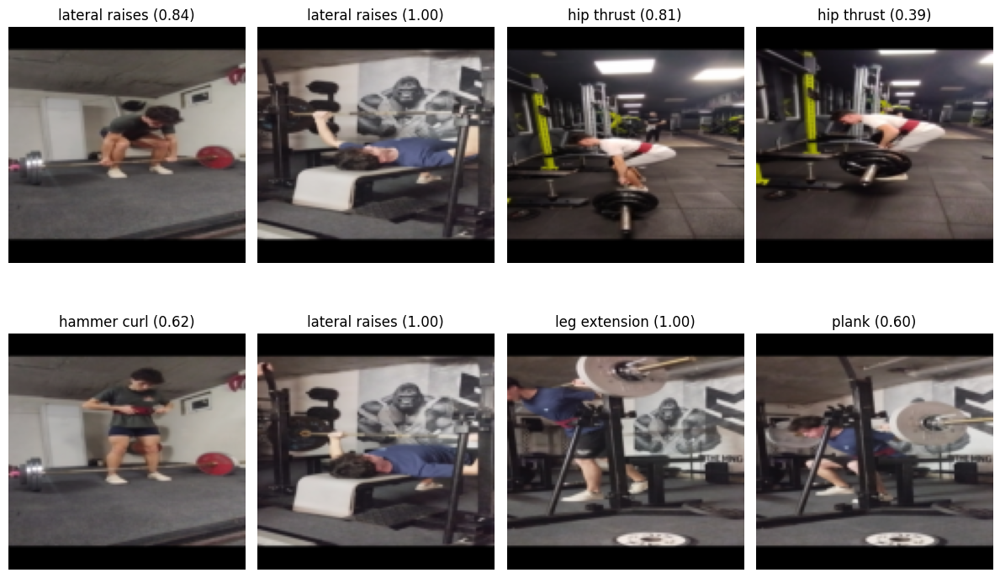

In [ ]:
test_on_my_dataset()



We are using the same model so as expected we didn't get good results still, but now we have an improvement! At least we see that the model isn't good by looking at our F1 score.

In [ ]:
torch.save(net.state_dict(), "model_02.pth")

Now we have to find a way to counteract the overfitting. First thing I'll try is to see if shrinking the training set will affect it.

In [ ]:
from collections import defaultdict

class_indices = defaultdict(list)

for idx, (_, label) in enumerate(dataset.samples):
    class_indices[label].append(idx)

train_idx, val_idx, test_idx = [], [], []

for label, idxs in class_indices.items():
    n = len(idxs)
    t1 = int(0.3 * n)
    t2 = int(0.65 * n)

    train_idx.extend(idxs[:t1])
    val_idx.extend(idxs[t1:t2])
    test_idx.extend(idxs[t2:])

train_dataset = Subset(dataset, train_idx)
val_dataset = Subset(dataset, val_idx)
test_dataset = Subset(dataset, test_idx)

print("Train:", count_labels(train_dataset))
print("Val:  ", count_labels(val_dataset))
print("Test: ", count_labels(test_dataset))


Train: Counter({12: 297, 9: 252, 18: 222, 7: 218, 0: 211, 20: 209, 19: 200, 8: 193, 1: 187, 21: 187, 13: 184, 14: 180, 10: 175, 6: 167, 15: 166, 5: 163, 3: 159, 2: 158, 16: 156, 4: 154, 11: 154, 17: 153})
Val:   Counter({12: 348, 9: 295, 18: 260, 7: 255, 0: 247, 20: 244, 19: 234, 8: 226, 1: 219, 21: 219, 13: 215, 14: 210, 10: 205, 6: 195, 15: 194, 5: 191, 3: 185, 2: 184, 16: 183, 4: 180, 11: 180, 17: 179})
Test:  Counter({12: 348, 9: 296, 18: 260, 7: 256, 0: 247, 20: 245, 19: 234, 8: 227, 1: 219, 21: 219, 13: 216, 14: 211, 10: 206, 6: 195, 15: 195, 5: 192, 3: 186, 2: 185, 16: 183, 4: 180, 11: 180, 17: 180})


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


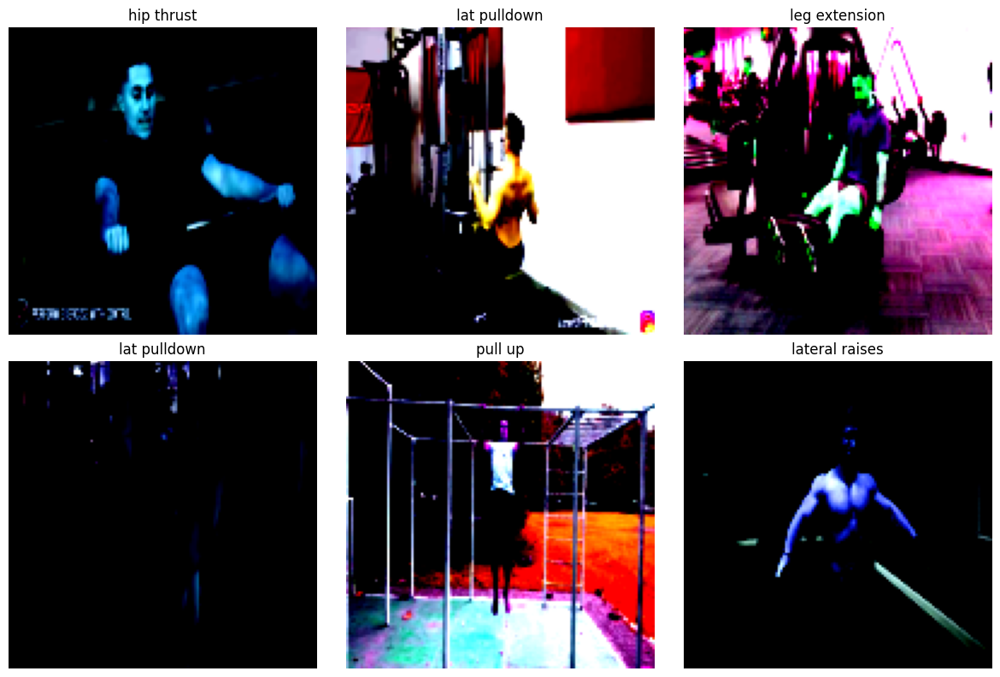

260
303
304


In [ ]:
dataloader_train, dataloader_val, dataloader_test = create_dataloaders()

print(len(dataloader_train))
print(len(dataloader_val))
print(len(dataloader_test))

In [ ]:
import torch

print(torch.cuda.is_available())
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# device = torch.device("cpu")
print("Using device:", device)



True
1
Tesla T4
Using device: cuda


100%|██████████| 606/606 [03:10<00:00,  3.18it/s]


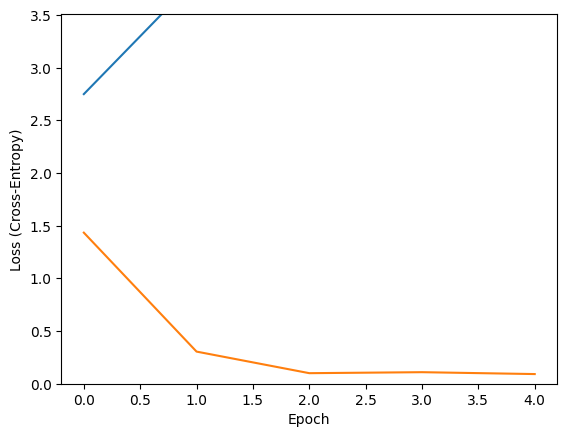

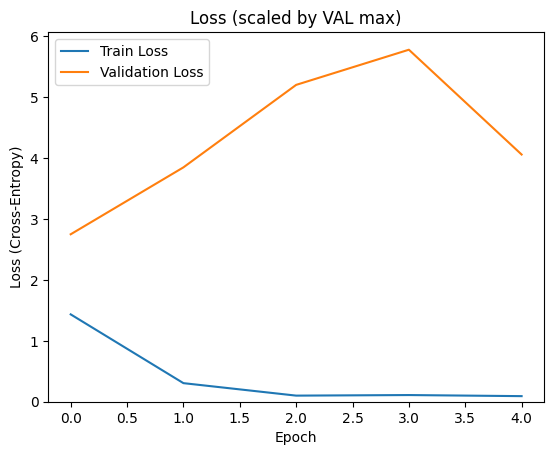

Total time taken to train the model in seconds: 1152.8445501327515


In [ ]:
import VGGNet
import torch.optim as optim
import time
import pprint
import importlib
import train_model

importlib.reload(VGGNet)
importlib.reload(train_model)


# subset_indices = np.random.choice(len(train_dataset), size=1, replace=False)
# debug_train = Subset(train_dataset, subset_indices)

# dataloader_debug = data.DataLoader(
#     debug_train,
#     batch_size=16,
#     shuffle=True,
#     num_workers=num_workers,
#     pin_memory=True
# )

net = VGGNet.VGGNet().to(device)
learning_rate = 5e-5
optimizer = optim.AdamW(net.parameters(), lr = learning_rate)

start_time = time.time()
loss_history = train_model.train_model(dataloader_train, dataloader_val, optimizer, net, 5, device, True)
# loss_history = train_model.train_model(dataloader_debug, [], optimizer, net, 30, device, True)
end_time = time.time()

total_time_taken = end_time - start_time
print(f"Total time taken to train the model in seconds: {total_time_taken}")


This didn't help, let's try shrinking the model.

100%|██████████| 606/606 [03:02<00:00,  3.33it/s]


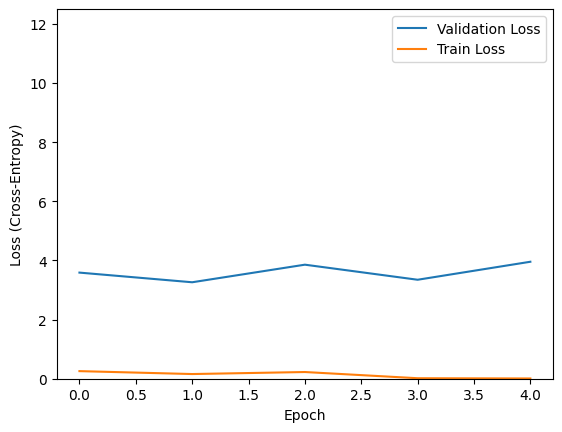

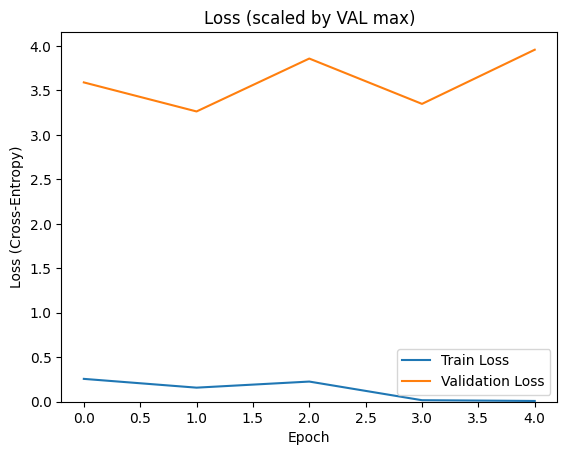

Total time taken to train the model in seconds: 1120.5424184799194


In [ ]:
import VGGNetSmall
import torch.optim as optim
import time
import pprint
import importlib
import train_model

importlib.reload(VGGNetSmall)
importlib.reload(train_model)


# subset_indices = np.random.choice(len(train_dataset), size=1, replace=False)
# debug_train = Subset(train_dataset, subset_indices)

# dataloader_debug = data.DataLoader(
#     debug_train,
#     batch_size=16,
#     shuffle=True,
#     num_workers=num_workers,
#     pin_memory=True
# )

net = VGGNetSmall.VGGNetSmall().to(device)
learning_rate = 5e-5
optimizer = optim.AdamW(net.parameters(), lr = learning_rate)

start_time = time.time()
loss_history = train_model.train_model(dataloader_train, dataloader_val, optimizer, net, 5, device, True)
# loss_history = train_model.train_model(dataloader_debug, [], optimizer, net, 30, device, True)
end_time = time.time()

total_time_taken = end_time - start_time
print(f"Total time taken to train the model in seconds: {total_time_taken}")


In [ ]:
print_metrics()

Summary statistics:
Precision: 0.34293646807358874
Recall: 0.2606643846857691
F1: 0.2500762608359146
Total time taken to train the model in seconds: 1120.5424184799194
{'barbell biceps curl': np.float64(0.014492753623188406),
 'bench press': np.float64(0.26262626262626265),
 'chest fly machine': np.float64(0.30120481927710846),
 'deadlift': np.float64(0.0),
 'decline bench press': np.float64(0.3619047619047619),
 'hammer curl': np.float64(0.1076923076923077),
 'hip thrust': np.float64(0.3119266055045872),
 'incline bench press': np.float64(0.3821138211382114),
 'lat pulldown': np.float64(0.4694533762057878),
 'lateral raises': np.float64(0.42016806722689076),
 'leg extension': np.float64(0.0625),
 'leg raises': np.float64(0.762589928057554),
 'plank': np.float64(0.3495702005730659),
 'pull up': np.float64(0.20614828209764918),
 'push up': np.float64(0.32061068702290074),
 'romanian deadlift': np.float64(0.022988505747126436),
 'russian twist': np.float64(0.22935779816513763),
 'shoulde

In [ ]:
torch.save(net.state_dict(), "model_03.pth")


Still doesn't work. Maybe the data isn't enough and the model can't pick up on what it should learn.

One idea would be to try to use a pose estimation model first and based on the output to run it through another model that could predict on this.

In [ ]:
!pip install ultralytics

from ultralytics import YOLO

# Load a pretrained YOLO26n-pose Pose model
model = YOLO("yolo26n-pose.pt")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 21.5 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(



0: 256x256 1 person, 7.4ms
1: 256x256 1 person, 7.4ms
2: 256x256 (no detections), 7.4ms
3: 256x256 (no detections), 7.4ms
4: 256x256 1 person, 7.4ms
5: 256x256 (no detections), 7.4ms
6: 256x256 1 person, 7.4ms
7: 256x256 1 person, 7.4ms
8: 256x256 (no detections), 7.4ms
9: 256x256 1 person, 7.4ms
10: 256x256 (no detections), 7.4ms
11: 256x256 (no detections), 7.4ms
12: 256x256 (no detections), 7.4ms
13: 256x256 (no detections), 7.4ms
14: 256x256 1 person, 7.4ms
15: 256x256 1 person, 7.4ms
Speed: 0.4ms preprocess, 7.4ms inference, 2.6ms postprocess per image at shape (1, 3, 256, 256)


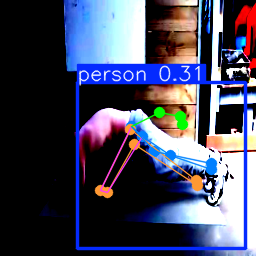

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.7025, 0.2261, 0.7341, 0.0429, 0.5420, 0.7500, 0.8441, 0.5181, 0.7785, 0.5689, 0.6759, 0.6542, 0.6871, 0.5956, 0.6471, 0.5960, 0.6709]], device='cuda:0')
data: tensor([[[1.8213e+02, 1.2500e+02, 7.0249e-01],
         [1.8272e+02, 1.1919e+02, 2.2606e-01],
         [1.8032e+02, 1.1692e+02, 7.3412e-01],
         [1.6709e+02, 1.1690e+02, 4.2877e-02],
         [1.5900e+02, 1.1206e+02, 5.4195e-01],
         [1.4267e+02, 1.3621e+02, 7.4999e-01],
         [1.3145e+02, 1.2606e+02, 8.4406e-01],
         [1.7057e+02, 1.5576e+02, 5.1809e-01],
         [1.5489e+02, 1.5121e+02, 7.7854e-01],
         [2.1138e+02, 1.6997e+02, 5.6887e-01],
         [2.1174e+02, 1.6311e+02, 6.7587e-01],
         [1.0717e+02, 1.9283e+02, 6.5424e-01],
         [1.0010e+02, 1.9070e+02, 6.8706e-01],
         [1.3415e+02, 1.4416e+02, 5.9559e-01],
         [1.3058e+02, 1.2911e+02, 6.4714e-01],
         [1.9790e+02, 1.8540e+02, 5.9595e-01],
         [

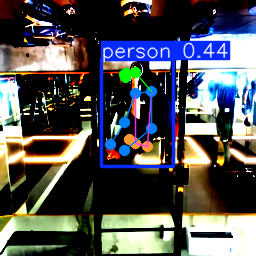

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.6538, 0.6215, 0.2662, 0.6910, 0.1232, 0.9765, 0.9075, 0.9476, 0.6739, 0.9094, 0.6707, 0.7979, 0.6960, 0.2714, 0.1440, 0.0913, 0.0481]], device='cuda:0')
data: tensor([[[1.2515e+02, 7.7326e+01, 6.5382e-01],
         [1.2693e+02, 7.3130e+01, 6.2146e-01],
         [1.2463e+02, 7.4099e+01, 2.6615e-01],
         [1.3568e+02, 7.2206e+01, 6.9095e-01],
         [1.2878e+02, 7.4375e+01, 1.2320e-01],
         [1.5157e+02, 9.1401e+01, 9.7648e-01],
         [1.3546e+02, 9.3083e+01, 9.0752e-01],
         [1.5153e+02, 1.2877e+02, 9.4762e-01],
         [1.2407e+02, 1.2266e+02, 6.7392e-01],
         [1.2404e+02, 1.5058e+02, 9.0945e-01],
         [1.1051e+02, 1.4442e+02, 6.7074e-01],
         [1.4722e+02, 1.4643e+02, 7.9789e-01],
         [1.3580e+02, 1.4328e+02, 6.9604e-01],
         [1.2942e+02, 1.3948e+02, 2.7138e-01],
         [1.1769e+02, 1.3433e+02, 1.4400e-01],
         [1.3024e+02, 1.5284e+02, 9.1258e-02],
         [

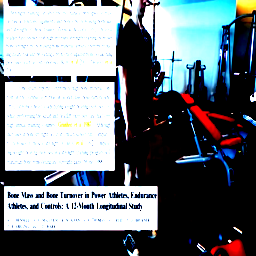

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


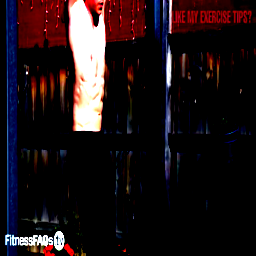

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


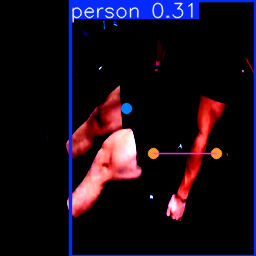

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.0374, 0.0710, 0.0699, 0.0306, 0.0303, 0.0370, 0.0673, 0.0751, 0.2343, 0.1788, 0.6083, 0.3053, 0.4003, 0.0193, 0.0319, 0.0238, 0.0261]], device='cuda:0')
data: tensor([[[1.7463e+02, 5.6846e+01, 3.7367e-02],
         [1.7785e+02, 4.7390e+01, 7.0960e-02],
         [1.7080e+02, 4.8790e+01, 6.9919e-02],
         [1.9978e+02, 4.0324e+01, 3.0615e-02],
         [1.6464e+02, 4.4110e+01, 3.0258e-02],
         [2.3057e+02, 3.5741e+01, 3.7001e-02],
         [1.4981e+02, 4.7234e+01, 6.7298e-02],
         [2.3747e+02, 3.0438e+01, 7.5106e-02],
         [1.5292e+02, 6.1898e+01, 2.3432e-01],
         [1.9010e+02, 8.3731e+01, 1.7882e-01],
         [1.2630e+02, 1.0804e+02, 6.0835e-01],
         [2.1651e+02, 1.5361e+02, 3.0526e-01],
         [1.5395e+02, 1.5312e+02, 4.0030e-01],
         [1.9759e+02, 1.5327e+02, 1.9348e-02],
         [1.4079e+02, 1.4803e+02, 3.1874e-02],
         [1.7342e+02, 1.5833e+02, 2.3808e-02],
         [

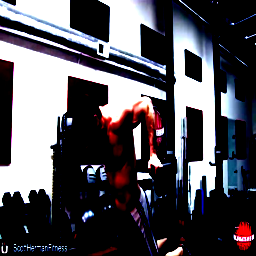

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


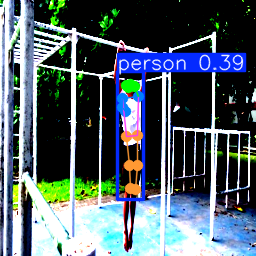

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.8286, 0.7704, 0.7086, 0.4230, 0.2469, 0.8756, 0.9201, 0.2372, 0.4759, 0.2243, 0.3341, 0.9410, 0.9487, 0.8787, 0.9080, 0.8077, 0.8423]], device='cuda:0')
data: tensor([[[128.2986,  87.2871,   0.8286],
         [130.5468,  84.8374,   0.7704],
         [126.1259,  85.1458,   0.7086],
         [134.9330,  86.0604,   0.4230],
         [123.4332,  86.9096,   0.2469],
         [138.0447,  96.8103,   0.8756],
         [122.7277,  98.7461,   0.9201],
         [142.2515,  99.9471,   0.2372],
         [122.3479, 107.3621,   0.4759],
         [138.8936,  88.8760,   0.2243],
         [125.4994, 111.4990,   0.3341],
         [137.6938, 135.8057,   0.9410],
         [126.8644, 136.4630,   0.9487],
         [137.4909, 165.0653,   0.8787],
         [129.1741, 165.1454,   0.9080],
         [135.8579, 189.0864,   0.8077],
         [130.0272, 188.9428,   0.8423]]], device='cuda:0')
has_visible: True
orig_shape: (256, 256)
shape

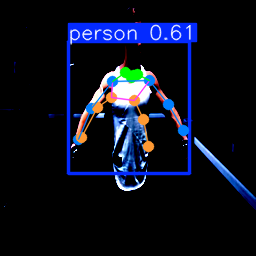

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.4532, 0.2782, 0.2126, 0.4091, 0.3664, 0.9966, 0.9928, 0.9951, 0.9814, 0.9847, 0.9632, 0.9906, 0.9890, 0.9174, 0.9283, 0.7935, 0.8467]], device='cuda:0')
data: tensor([[[131.2493,  77.5271,   0.4532],
         [133.3750,  75.6353,   0.2782],
         [130.1691,  75.0300,   0.2126],
         [137.7285,  74.3146,   0.4091],
         [125.6897,  72.7192,   0.3664],
         [149.1448,  80.5566,   0.9966],
         [112.4559,  81.2342,   0.9928],
         [168.5184, 104.2534,   0.9951],
         [ 91.2902, 108.2767,   0.9814],
         [183.9879, 130.5552,   0.9847],
         [ 78.2514, 139.7904,   0.9632],
         [134.4505, 100.4463,   0.9906],
         [111.5787,  97.9308,   0.9890],
         [143.5293, 119.4425,   0.9174],
         [ 97.7715, 107.9906,   0.9283],
         [148.4024, 146.4160,   0.7935],
         [ 81.0448, 137.8746,   0.8467]]], device='cuda:0')
has_visible: True
orig_shape: (256, 256)
shape

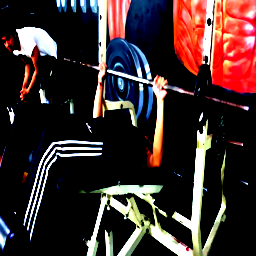

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


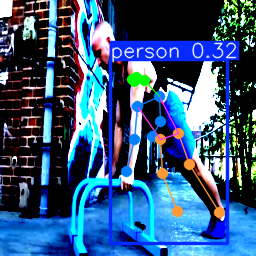

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.8652, 0.8052, 0.6248, 0.6157, 0.1937, 0.9613, 0.9519, 0.6432, 0.8946, 0.5529, 0.9222, 0.9725, 0.9424, 0.9910, 0.9148, 0.9883, 0.8603]], device='cuda:0')
data: tensor([[[1.3441e+02, 8.1425e+01, 8.6523e-01],
         [1.3608e+02, 7.7722e+01, 8.0518e-01],
         [1.3214e+02, 7.9867e+01, 6.2485e-01],
         [1.4492e+02, 8.0244e+01, 6.1569e-01],
         [1.3313e+02, 8.5557e+01, 1.9370e-01],
         [1.5940e+02, 9.6324e+01, 9.6128e-01],
         [1.3744e+02, 1.0606e+02, 9.5187e-01],
         [1.6093e+02, 1.2142e+02, 6.4324e-01],
         [1.3425e+02, 1.3966e+02, 8.9460e-01],
         [1.5238e+02, 1.3655e+02, 5.5292e-01],
         [1.2624e+02, 1.7162e+02, 9.2218e-01],
         [1.7816e+02, 1.3388e+02, 9.7246e-01],
         [1.6079e+02, 1.3921e+02, 9.4242e-01],
         [1.8963e+02, 1.6477e+02, 9.9099e-01],
         [1.6213e+02, 1.7374e+02, 9.1476e-01],
         [2.1915e+02, 2.1236e+02, 9.8833e-01],
         [

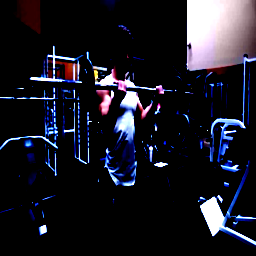

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


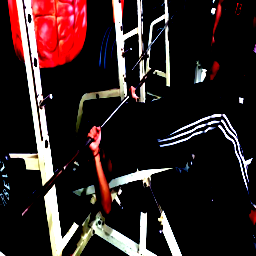

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


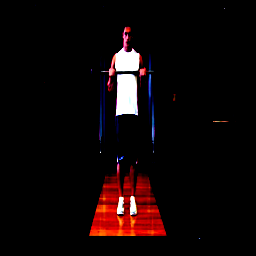

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


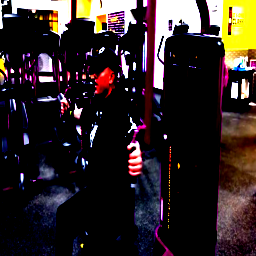

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


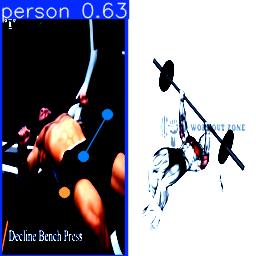

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.0185, 0.0239, 0.0082, 0.0111, 0.0026, 0.1361, 0.0071, 0.4466, 0.0196, 0.6896, 0.1827, 0.3861, 0.1333, 0.0778, 0.0256, 0.0595, 0.0147]], device='cuda:0')
data: tensor([[[3.9515e+01, 1.7891e+01, 1.8524e-02],
         [4.1818e+01, 1.0833e+01, 2.3863e-02],
         [3.7352e+01, 9.8406e+00, 8.2333e-03],
         [5.6855e+01, 4.6275e+00, 1.1130e-02],
         [2.8601e+01, 2.7940e+00, 2.5606e-03],
         [8.5797e+01, 1.7804e+01, 1.3610e-01],
         [1.6371e+01, 1.1061e+01, 7.1206e-03],
         [1.0703e+02, 1.1412e+02, 4.4658e-01],
         [3.6443e+01, 9.3518e+01, 1.9591e-02],
         [8.3374e+01, 1.5652e+02, 6.8957e-01],
         [5.5762e+01, 1.4928e+02, 1.8266e-01],
         [6.4242e+01, 1.9210e+02, 3.8608e-01],
         [9.5808e+00, 1.8999e+02, 1.3327e-01],
         [8.3669e+01, 1.4132e+02, 7.7770e-02],
         [3.0969e+01, 1.4648e+02, 2.5628e-02],
         [9.0501e+01, 1.6940e+02, 5.9507e-02],
         [

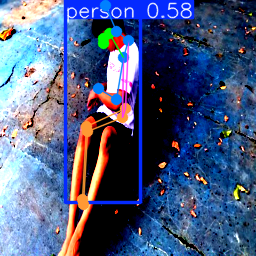

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.6187, 0.6118, 0.0468, 0.8782, 0.0243, 0.9947, 0.8826, 0.9930, 0.3678, 0.9863, 0.3551, 0.9588, 0.8226, 0.8861, 0.4584, 0.6958, 0.2915]], device='cuda:0')
data: tensor([[[1.0309e+02, 4.3411e+01, 6.1868e-01],
         [1.0314e+02, 3.8363e+01, 6.1182e-01],
         [1.0312e+02, 3.8380e+01, 4.6795e-02],
         [1.0968e+02, 3.3305e+01, 8.7819e-01],
         [1.1389e+02, 3.3237e+01, 2.4284e-02],
         [1.2362e+02, 5.7666e+01, 9.9473e-01],
         [1.2880e+02, 4.0381e+01, 8.8259e-01],
         [1.1671e+02, 9.9730e+01, 9.9296e-01],
         [1.1605e+02, 3.1953e+01, 3.6775e-01],
         [9.8803e+01, 8.8142e+01, 9.8630e-01],
         [1.0559e+02, 5.7086e+00, 3.5510e-01],
         [1.2251e+02, 1.1719e+02, 9.5882e-01],
         [1.2522e+02, 1.0879e+02, 8.2264e-01],
         [8.7937e+01, 1.3150e+02, 8.8615e-01],
         [8.6090e+01, 1.2698e+02, 4.5843e-01],
         [8.3772e+01, 2.0466e+02, 6.9584e-01],
         [

In [ ]:
images, labels = next(iter(dataloader_train))

images = torch.clip(images, 0, 1)

results = model(images)  # return a list of Results objects
for result in results:
  result.show()
  print(result.keypoints)


Maybe this model doesn't work that well with these extreme data augmentation settings, let's try to apply ones that aren't as much.


Train: Counter({12: 695, 9: 590, 18: 519, 7: 510, 0: 493, 20: 488, 19: 467, 8: 452, 1: 437, 21: 437, 13: 430, 14: 420, 10: 410, 6: 389, 15: 388, 5: 382, 3: 371, 2: 368, 16: 365, 4: 359, 11: 359, 17: 358})
Val:   Counter({12: 149, 9: 126, 18: 111, 7: 109, 0: 106, 20: 105, 19: 100, 8: 97, 1: 94, 21: 94, 13: 92, 14: 90, 10: 88, 6: 84, 15: 83, 5: 82, 2: 79, 3: 79, 16: 78, 4: 77, 11: 77, 17: 77})
Test:  Counter({12: 149, 9: 127, 18: 112, 7: 110, 0: 106, 20: 105, 19: 101, 8: 97, 1: 94, 21: 94, 13: 93, 14: 91, 10: 88, 6: 84, 15: 84, 5: 82, 2: 80, 3: 80, 16: 79, 4: 78, 11: 78, 17: 77})


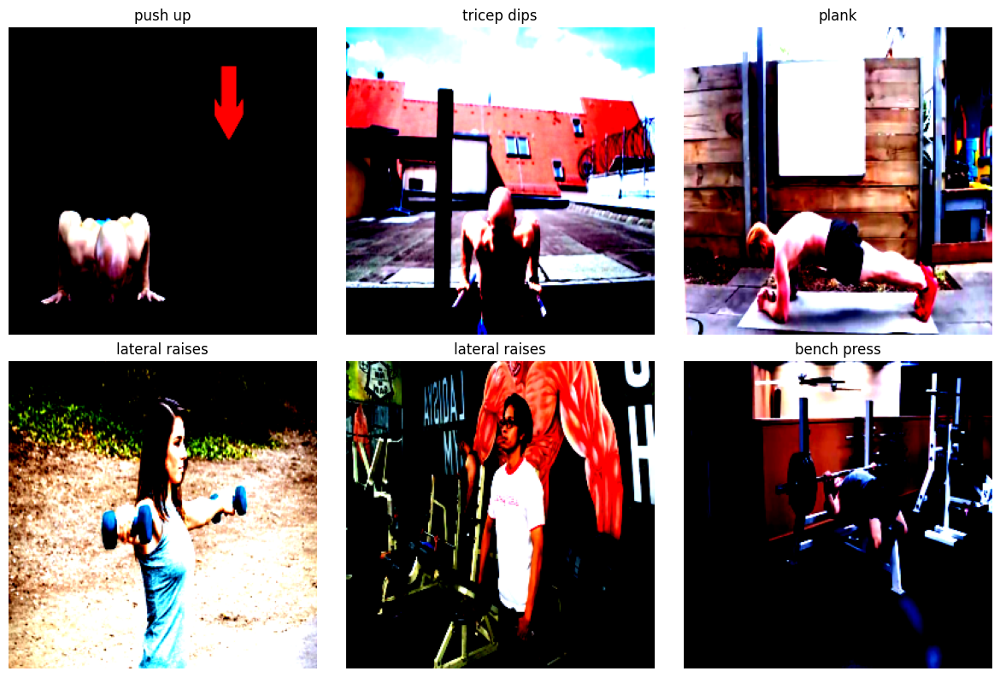

606
130
131


In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset
from torch.utils import data

image_transforms = transforms.Compose([
  transforms.RandomHorizontalFlip(), # simulate different viewpoints
#   transforms.RandomVerticalFlip(),
#   transforms.RandomRotation(45),
  transforms.ToTensor(), # convert the object into a tensor
  transforms.Resize((256, 256)), # resize the images
  transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
    #Normalizing the data to be zero-centered.
  #Initially I normalized it by using the
  #dataset mean and std, but I later changed it
  #to use the ImageNet normalization,
  #so that i can use the same data if i try
  #fine-tuning a model.
  ])

dataset = ImageFolder('data',
    transform=image_transforms
)

from collections import defaultdict

class_indices = defaultdict(list)

for idx, (_, label) in enumerate(dataset.samples):
    class_indices[label].append(idx)

train_idx, val_idx, test_idx = [], [], []

for label, idxs in class_indices.items():
    n = len(idxs)
    t1 = int(0.7 * n)
    t2 = int(0.85 * n)

    train_idx.extend(idxs[:t1])
    val_idx.extend(idxs[t1:t2])
    test_idx.extend(idxs[t2:])

train_dataset = Subset(dataset, train_idx)
val_dataset = Subset(dataset, val_idx)
test_dataset = Subset(dataset, test_idx)

print("Train:", count_labels(train_dataset))
print("Val:  ", count_labels(val_dataset))
print("Test: ", count_labels(test_dataset))

dataloader_train, dataloader_val, dataloader_test = create_dataloaders()

print(len(dataloader_train))
print(len(dataloader_val))
print(len(dataloader_test))


0: 256x256 (no detections), 3.4ms
1: 256x256 (no detections), 3.4ms
2: 256x256 2 persons, 3.4ms
3: 256x256 (no detections), 3.4ms
4: 256x256 (no detections), 3.4ms
5: 256x256 1 person, 3.4ms
6: 256x256 1 person, 3.4ms
7: 256x256 (no detections), 3.4ms
8: 256x256 (no detections), 3.4ms
9: 256x256 (no detections), 3.4ms
10: 256x256 1 person, 3.4ms
11: 256x256 1 person, 3.4ms
12: 256x256 1 person, 3.4ms
13: 256x256 (no detections), 3.4ms
14: 256x256 (no detections), 3.4ms
15: 256x256 (no detections), 3.4ms
Speed: 0.3ms preprocess, 3.4ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)


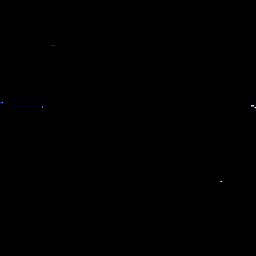

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


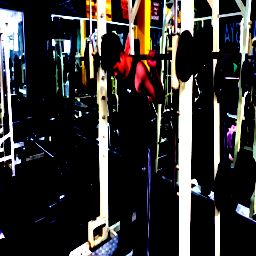

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


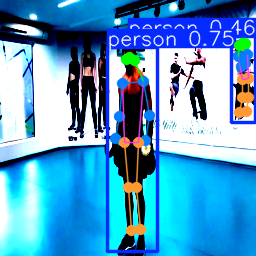

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.5535, 0.4385, 0.1946, 0.6020, 0.1610, 0.9896, 0.9683, 0.9575, 0.8001, 0.9298, 0.7971, 0.9952, 0.9927, 0.9923, 0.9911, 0.9858, 0.9843],
        [0.7286, 0.4729, 0.7572, 0.1289, 0.6602, 0.6222, 0.9549, 0.1297, 0.8732, 0.1950, 0.8016, 0.8000, 0.9452, 0.7212, 0.9295, 0.6346, 0.8635]], device='cuda:0')
data: tensor([[[1.2682e+02, 5.9772e+01, 5.5354e-01],
         [1.2946e+02, 5.7108e+01, 4.3852e-01],
         [1.2575e+02, 5.7086e+01, 1.9459e-01],
         [1.3476e+02, 6.0519e+01, 6.0202e-01],
         [1.2558e+02, 6.0266e+01, 1.6097e-01],
         [1.4332e+02, 8.1997e+01, 9.8964e-01],
         [1.2247e+02, 8.3775e+01, 9.6829e-01],
         [1.4951e+02, 1.1554e+02, 9.5747e-01],
         [1.1979e+02, 1.1647e+02, 8.0013e-01],
         [1.4581e+02, 1.4040e+02, 9.2979e-01],
         [1.1547e+02, 1.3848e+02, 7.9705e-01],
         [1.3883e+02, 1.4213e+02, 9.9518e-01],
         [1.2477e+02, 1.4255e+02, 9.9270e-01],
     

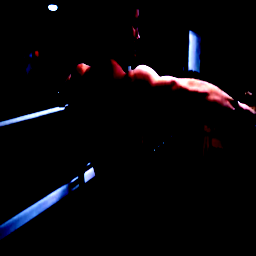

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


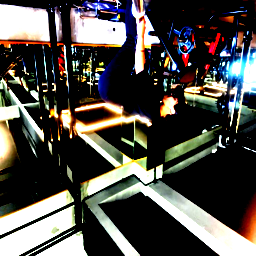

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


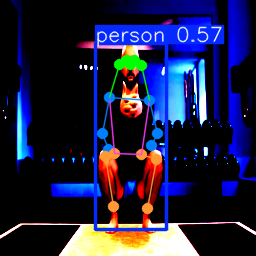

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.9440, 0.9564, 0.9524, 0.7240, 0.7705, 0.9679, 0.9581, 0.6434, 0.7072, 0.5592, 0.7486, 0.9718, 0.9658, 0.9586, 0.9463, 0.9367, 0.8955]], device='cuda:0')
data: tensor([[[130.3123,  64.8965,   0.9440],
         [134.8221,  60.9060,   0.9564],
         [126.0484,  60.3537,   0.9524],
         [141.4979,  65.9120,   0.7240],
         [119.3687,  64.4591,   0.7705],
         [149.6008, 100.0932,   0.9679],
         [109.7939,  97.7255,   0.9581],
         [157.1266, 133.0569,   0.6434],
         [102.9533, 133.6032,   0.7072],
         [151.2322, 145.3135,   0.5592],
         [108.3741, 149.3823,   0.7486],
         [141.7111, 154.9678,   0.9718],
         [114.2707, 153.8109,   0.9658],
         [156.0022, 159.3238,   0.9586],
         [105.3239, 156.7205,   0.9463],
         [147.4638, 208.0746,   0.9367],
         [113.3940, 206.6464,   0.8955]]], device='cuda:0')
has_visible: True
orig_shape: (256, 256)
shape

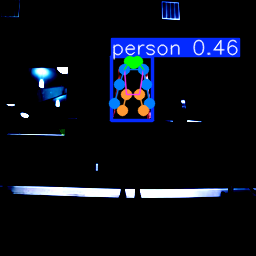

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.4182, 0.3841, 0.3601, 0.3367, 0.3368, 0.9765, 0.9858, 0.9557, 0.9550, 0.8947, 0.8760, 0.9649, 0.9718, 0.5706, 0.6142, 0.1125, 0.1315]], device='cuda:0')
data: tensor([[[1.3375e+02, 6.3816e+01, 4.1819e-01],
         [1.3505e+02, 6.2037e+01, 3.8415e-01],
         [1.3240e+02, 6.2040e+01, 3.6010e-01],
         [1.3767e+02, 6.1737e+01, 3.3665e-01],
         [1.2992e+02, 6.1823e+01, 3.3678e-01],
         [1.4369e+02, 6.9100e+01, 9.7654e-01],
         [1.2423e+02, 6.9202e+01, 9.8580e-01],
         [1.4689e+02, 8.4107e+01, 9.5571e-01],
         [1.1965e+02, 8.4470e+01, 9.5501e-01],
         [1.4972e+02, 1.0376e+02, 8.9472e-01],
         [1.1447e+02, 1.0366e+02, 8.7600e-01],
         [1.3965e+02, 9.4668e+01, 9.6486e-01],
         [1.2678e+02, 9.4625e+01, 9.7177e-01],
         [1.4304e+02, 1.1068e+02, 5.7065e-01],
         [1.2247e+02, 1.1043e+02, 6.1424e-01],
         [1.4462e+02, 1.1757e+02, 1.1253e-01],
         [

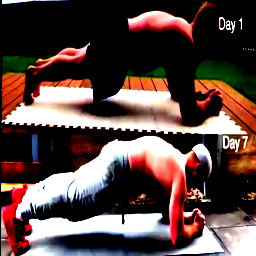

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


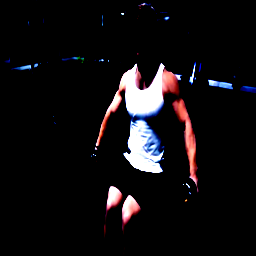

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


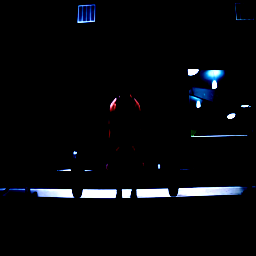

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


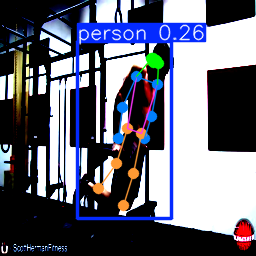

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.6148, 0.4769, 0.4237, 0.3335, 0.2681, 0.9424, 0.9564, 0.6382, 0.8514, 0.7043, 0.9096, 0.9863, 0.9897, 0.9740, 0.9820, 0.8900, 0.9276]], device='cuda:0')
data: tensor([[[153.4978,  62.0185,   0.6148],
         [156.0341,  60.0972,   0.4769],
         [153.8033,  58.0990,   0.4237],
         [158.2477,  63.4516,   0.3335],
         [151.1074,  58.3249,   0.2681],
         [157.8241,  84.0500,   0.9424],
         [136.2901,  76.3339,   0.9564],
         [151.8068, 116.9713,   0.6382],
         [122.6306, 107.6575,   0.8514],
         [144.7926, 138.3605,   0.7043],
         [118.6378, 138.2751,   0.9096],
         [141.6720, 133.1135,   0.9863],
         [127.3605, 128.5689,   0.9897],
         [133.8145, 173.2818,   0.9740],
         [116.4727, 163.2690,   0.9820],
         [123.7845, 205.3122,   0.8900],
         [ 98.4819, 188.6251,   0.9276]]], device='cuda:0')
has_visible: True
orig_shape: (256, 256)
shape

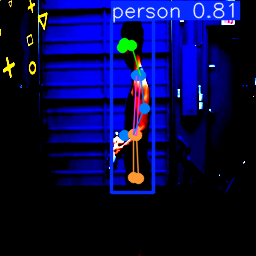

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.6163, 0.7501, 0.0582, 0.9388, 0.0309, 0.9943, 0.7245, 0.9865, 0.2018, 0.9787, 0.4863, 0.9600, 0.8171, 0.8238, 0.5303, 0.1166, 0.0466]], device='cuda:0')
data: tensor([[[1.2210e+02, 4.7749e+01, 6.1627e-01],
         [1.2410e+02, 4.3350e+01, 7.5006e-01],
         [1.2286e+02, 4.3154e+01, 5.8225e-02],
         [1.3171e+02, 4.5571e+01, 9.3879e-01],
         [1.3187e+02, 4.5013e+01, 3.0853e-02],
         [1.4037e+02, 7.5988e+01, 9.9427e-01],
         [1.3663e+02, 7.5690e+01, 7.2450e-01],
         [1.4478e+02, 1.0807e+02, 9.8653e-01],
         [1.3291e+02, 1.0730e+02, 2.0181e-01],
         [1.3353e+02, 1.3431e+02, 9.7872e-01],
         [1.2405e+02, 1.3500e+02, 4.8632e-01],
         [1.3640e+02, 1.3543e+02, 9.6003e-01],
         [1.3311e+02, 1.3426e+02, 8.1706e-01],
         [1.3858e+02, 1.7882e+02, 8.2378e-01],
         [1.3373e+02, 1.7703e+02, 5.3026e-01],
         [1.3872e+02, 2.0426e+02, 1.1659e-01],
         [

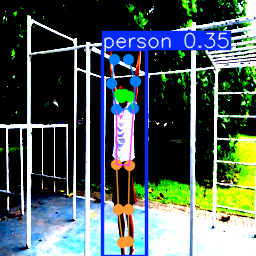

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.8888, 0.8589, 0.6989, 0.6421, 0.2340, 0.9622, 0.9591, 0.8988, 0.8795, 0.8614, 0.8472, 0.9855, 0.9867, 0.9526, 0.9541, 0.8001, 0.7654]], device='cuda:0')
data: tensor([[[1.2152e+02, 9.7484e+01, 8.8883e-01],
         [1.2419e+02, 9.4729e+01, 8.5886e-01],
         [1.1952e+02, 9.4389e+01, 6.9888e-01],
         [1.2936e+02, 9.6683e+01, 6.4205e-01],
         [1.1681e+02, 9.6077e+01, 2.3398e-01],
         [1.3388e+02, 1.0830e+02, 9.6223e-01],
         [1.1632e+02, 1.0907e+02, 9.5908e-01],
         [1.3559e+02, 8.1780e+01, 8.9880e-01],
         [1.1179e+02, 8.3096e+01, 8.7952e-01],
         [1.2859e+02, 5.9384e+01, 8.6143e-01],
         [1.1463e+02, 5.9311e+01, 8.4723e-01],
         [1.2997e+02, 1.6514e+02, 9.8547e-01],
         [1.1644e+02, 1.6494e+02, 9.8673e-01],
         [1.2839e+02, 2.0912e+02, 9.5263e-01],
         [1.1862e+02, 2.0913e+02, 9.5411e-01],
         [1.2871e+02, 2.4110e+02, 8.0012e-01],
         [

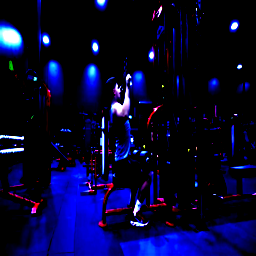

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


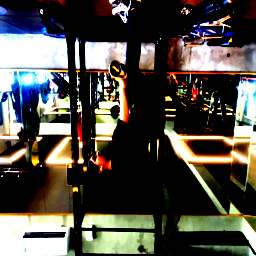

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


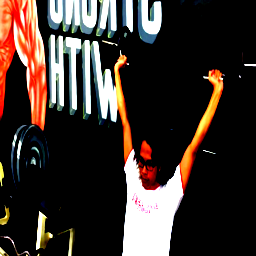

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([], device='cuda:0', size=(0, 17))
data: tensor([], device='cuda:0', size=(0, 17, 3))
has_visible: True
orig_shape: (256, 256)
shape: torch.Size([0, 17, 3])
xy: tensor([], device='cuda:0', size=(0, 17, 2))
xyn: tensor([], device='cuda:0', size=(0, 17, 2))


In [ ]:
images, labels = next(iter(dataloader_train))

images = torch.clip(images, 0, 1)

results = model(images)  # return a list of Results objects
for result in results:
  result.show()
  print(result.keypoints)

This pose estimation model seems to fail to detect the person sometimes. I can have the VGG model for when it fails to detect and another model for when it succeeds. The other model could just take the keypoint coordinates as input and output the categories. If i can get the keypoints, the data stops beeing an image and starts being just points, so maybe a simpler model could be good at predicting.


First of all I have to create a dataset of keypoints - label, so that I can train the other model.

In [ ]:
from tqdm import tqdm

def build_keypoint_dataset(dataloader, model):
    X = []
    y = []

    for images, labels in tqdm(dataloader):

      images = torch.clip(images, 0, 1)
      results = model(images, verbose=False)

      for i in range(len(results)):
        result = results[i]
        if result.keypoints.shape[0] == 0: #drop samples that don't have people detected
          continue

        kp_xyn = result.keypoints.xyn.cpu() #xyn is normalized xy of keypoints
        conf = result.keypoints.conf.cpu() #confidence scores of kp

        person_idx = conf.mean(dim=1).argmax() #getting idx of most confident scores of a single person
        #because multiple can be detected
        kp = torch.cat(
            [kp_xyn[person_idx], conf[person_idx].unsqueeze(1)],
            dim=1
        )
        X.append(kp)
        y.append(labels[i])

    return X, y


In [ ]:
X_test, y_test = build_keypoint_dataset(dataloader_test, model)

100%|██████████| 131/131 [02:40<00:00,  1.23s/it]


In [ ]:
print(len(X_test))
print(len(y_test))

print(X_test[0].shape)
print(X_test[0])
print(y_test[0])

1193
1193
torch.Size([17, 3])
tensor([[0.5603, 0.4823, 0.7122],
        [0.5729, 0.4708, 0.4801],
        [0.5430, 0.4732, 0.6365],
        [0.5863, 0.4964, 0.3226],
        [0.5098, 0.5026, 0.5345],
        [0.5933, 0.5663, 0.9586],
        [0.4656, 0.5796, 0.9719],
        [0.6313, 0.4766, 0.9459],
        [0.3580, 0.5356, 0.8922],
        [0.6102, 0.3728, 0.9531],
        [0.3819, 0.4325, 0.8308],
        [0.5497, 0.8451, 0.8515],
        [0.4609, 0.8470, 0.8769],
        [0.5584, 0.9892, 0.1073],
        [0.4629, 0.9865, 0.1148],
        [0.5541, 0.9675, 0.0153],
        [0.4428, 0.9623, 0.0129]])
tensor(13)


The shapes look correct, so let's get the training and validation also. Ideally we should expect the proportions of the dataset to be the same, otherwise it would mean that the split wasn't good all along.

In [ ]:
X_train, y_train = build_keypoint_dataset(dataloader_train, model)
X_val, y_val = build_keypoint_dataset(dataloader_val, model)

100%|██████████| 130/130 [02:00<00:00,  1.08it/s]


In [ ]:
print(len(X_train))
print(len(y_train))

print(len(X_val))
print(len(y_val))

4944
4944
1101
1101


They somewhat have the same proportions so that's good. We see that the model detects a person around 55% of the time on our dataset.

In [ ]:
torch.save({
    "X_train": X_train,
    "y_train": y_train,
    "X_val": X_val,
    "y_val": y_val,
    "X_test": X_test,
    "y_test": y_test
}, "keypoints_dataset.pt")

We also saved them if we need it another time. Now let's train a model to predict based on them.

One data entry consists of a (17,3) Tensor with normalized values (floating point numbers). Before jumping to neural networks, since this is an easier task than computer vision, let's try some simpler models.

In [ ]:
import torch

data = torch.load("keypoints_dataset.pt")

X_train = data["X_train"]
y_train = data["y_train"]
X_val   = data["X_val"]
y_val   = data["y_val"]
X_test  = data["X_test"]
y_test  = data["y_test"]


print(len(X_train))

4944


In [ ]:
import numpy as np

X_train = np.array(X_train)
y_train = np.array(y_train)

X_val = np.array(X_val)
y_val = np.array(y_val)

X_test = np.array(X_val)
y_test = np.array(y_val)

print(X_train.shape)
print(y_train.shape)

X_train = X_train.reshape(X_train.shape[0], -1)
X_val = X_val.reshape(X_val.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)

print(X_train.shape)
print(y_train.shape)

print(X_val.shape)
print(y_val.shape)

(4944, 17, 3)
(4944,)
(4944, 51)
(4944,)
(1101, 51)
(1101,)


In [ ]:
!pip install catboost

In [ ]:
from collections import Counter


label_counts = Counter(y_train)

total = len(y_train)
for label_idx, count in label_counts.items():
    pct = 100 * count / total
    print(f"{dataset.classes[label_idx]}: {pct:.2f}% ({count})")

squat: 5.28% (261)
deadlift: 3.90% (193)
push up: 4.23% (209)
lateral raises: 8.92% (441)
chest fly machine: 4.15% (205)
russian twist: 5.70% (282)
barbell biceps curl: 6.23% (308)
plank: 9.63% (476)
leg raises: 2.27% (112)
pull up: 3.88% (192)
leg extension: 5.58% (276)
t bar row: 6.57% (325)
decline bench press: 2.51% (124)
romanian deadlift: 1.13% (56)
tricep pushdown: 4.61% (228)
hammer curl: 6.76% (334)
shoulder press: 5.91% (292)
hip thrust: 2.91% (144)
lat pulldown: 3.09% (153)
tricep dips: 3.58% (177)
incline bench press: 1.82% (90)
bench press: 1.33% (66)


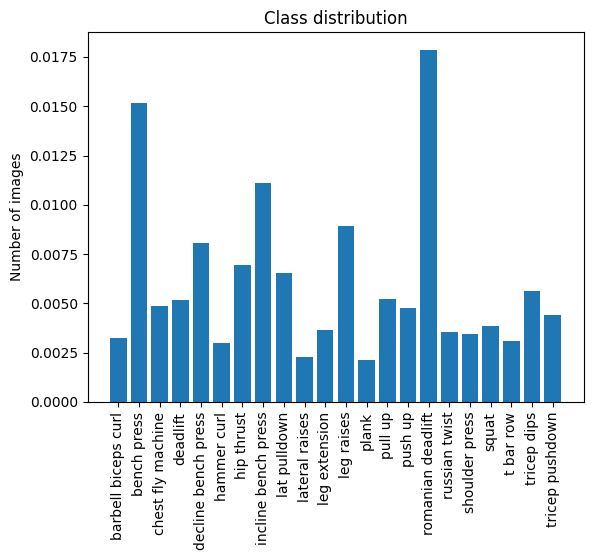

In [ ]:
class_names = dataset.classes
counts = [label_counts[i] for i in range(len(class_names))]

plt.bar(class_names, counts)
plt.ylabel("Number of images")
plt.title("Class distribution")
plt.xticks(class_names, rotation=90)
plt.show()


In [ ]:
import classification

import importlib
importlib.reload(classification)
import pandas as pd

models = classification.classify(X_train=X_train, X_test = X_val, y_train = y_train, y_test = y_val, filename='./model_report_keypoints.xlsx', diagrams='./diagrams', append=False, label_names=dataset.classes)



The best model achieved a 0.38 F1 score, but when examined more carefully, we can see that it predicts better on the classes that have more training examples. This is because our data distribution is unbalanced. Let's try to work around this by using a weighted classification, where classes with less examples have a higher weight to counteract this.

In [ ]:
import classification_weighted

import importlib
importlib.reload(classification_weighted)
import pandas as pd

models = classification_weighted.classify(X_train=X_train, X_test = X_val, y_train = y_train, y_test = y_val, filename='./model_report_keypoints_weighted.xlsx', diagrams='./diagrams', append=False, label_names=dataset.classes)






The class weights didn't help much, let's try using a NN to see if it will perform better. To counteract the classs imbalance I will first calculate the class weights, that I will pass to my loss function.

In [ ]:
import numpy as np

label_counts = 1 / np.array(counts) #getting the inverse counts
#because i want the class with more count to have less weight
class_weights = label_counts / np.sum(label_counts)

print(class_weights)
print(np.sum(class_weights))


[0.06229773 0.01334951 0.0414644  0.03903722 0.02508091 0.06755663
 0.02912621 0.01820388 0.0309466  0.08919903 0.05582524 0.02265372
 0.09627832 0.03883495 0.04227346 0.01132686 0.05703883 0.05906149
 0.05279126 0.06573625 0.03580097 0.0461165 ]
1.0000000000000002


In [ ]:
import torch
from torch.utils.data import TensorDataset
from torch.utils import data

X_test = np.array(X_test)

# Convert to torch tensors
X_train_t = torch.tensor(X_train, dtype=torch.float32)
y_train_t = torch.tensor(y_train, dtype=torch.long)

X_val_t = torch.tensor(X_val, dtype=torch.float32)
y_val_t = torch.tensor(y_val, dtype=torch.long)

X_test_t = torch.tensor(X_test, dtype=torch.float32)
y_test_t = torch.tensor(y_test, dtype=torch.long)

# Create datasets
train_dataset = TensorDataset(X_train_t, y_train_t)
val_dataset   = TensorDataset(X_val_t, y_val_t)
test_dataset  = TensorDataset(X_test_t, y_test_t)

dataloader_train, dataloader_val, dataloader_test = create_dataloaders(show=False)


In [ ]:
print(torch.cuda.is_available())
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# device = torch.device("cpu")
print("Using device:", device)

True
1
Tesla T4
Using device: cuda


100%|██████████| 309/309 [00:01<00:00, 204.94it/s]


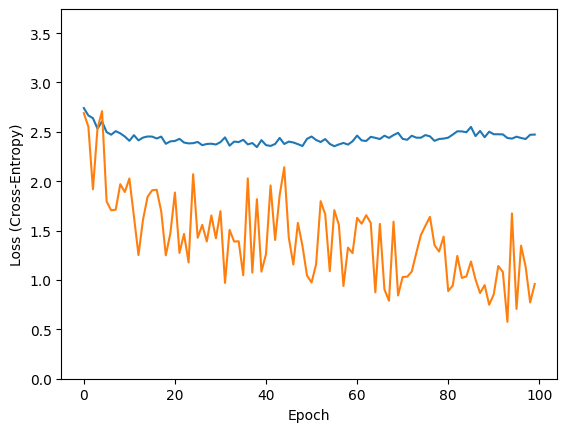

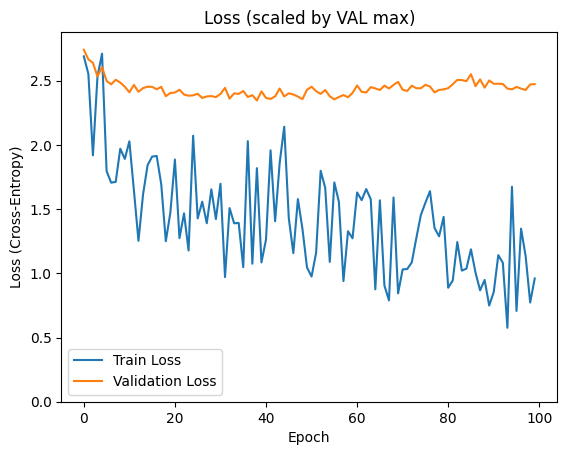

Total time taken to train the model in seconds: 225.05358982086182


In [ ]:
import KeypointNN
importlib.reload(KeypointNN)
import torch.optim as optim
import time
import train_model
importlib.reload(train_model)

net = KeypointNN.KeypointNN().to(device)
learning_rate = 1e-3
optimizer = optim.AdamW(net.parameters(), lr = learning_rate)

start_time = time.time()
loss_history = train_model.train_model(dataloader_train, dataloader_val, optimizer, net, 100, device, True, class_weights)
end_time = time.time()

total_time_taken = end_time - start_time
print(f"Total time taken to train the model in seconds: {total_time_taken}")


We can see that the model is overfitting the training data without moving the validation.

In [ ]:
print_metrics()

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Summary statistics:
Precision: 0.3797120555613155
Recall: 0.3857518577723685
F1: 0.36064093472387515
Total time taken to train the model in seconds: 225.05358982086182
{'barbell biceps curl': np.float64(0.3120567375886525),
 'bench press': np.float64(0.13333333333333333),
 'chest fly machine': np.float64(0.5454545454545454),
 'deadlift': np.float64(0.021052631578947368),
 'decline bench press': np.float64(0.7238095238095238),
 'hammer curl': np.float64(0.2535211267605634),
 'hip thrust': np.float64(0.15384615384615385),
 'incline bench press': np.float64(0.0),
 'lat pulldown': np.float64(0.2857142857142857),
 'lateral raises': np.float64(0.6120218579234973),
 'leg extension': np.float64(0.7821229050279329),
 'leg raises': np.float64(0.3076923076923077),
 'plank': np.float64(0.8983957219251337),
 'pull up': np.float64(0.3617021276595745),
 'push up': np.float64(0.5),
 'romanian deadlift': np.float64(0.0),
 'russian twist': np.float64(0.5486725663716814),
 'shoulder press': np.float64(0.

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Even with the keypoint detection model, we see that it performs in the same way. This looks more and more like a data problem, since for some classes like plank, t-bar row or decline bench press it has much better f1 scores compared to others.

I will try evaluating a pretrained model, found in Hugging Face.

In [ ]:
!pip install -q transformers torch pillow


Train: Counter({12: 695, 9: 590, 18: 519, 7: 510, 0: 493, 20: 488, 19: 467, 8: 452, 1: 437, 21: 437, 13: 430, 14: 420, 10: 410, 6: 389, 15: 388, 5: 382, 3: 371, 2: 368, 16: 365, 4: 359, 11: 359, 17: 358})
Val:   Counter({12: 149, 9: 126, 18: 111, 7: 109, 0: 106, 20: 105, 19: 100, 8: 97, 1: 94, 21: 94, 13: 92, 14: 90, 10: 88, 6: 84, 15: 83, 5: 82, 2: 79, 3: 79, 16: 78, 4: 77, 11: 77, 17: 77})
Test:  Counter({12: 149, 9: 127, 18: 112, 7: 110, 0: 106, 20: 105, 19: 101, 8: 97, 1: 94, 21: 94, 13: 93, 14: 91, 10: 88, 6: 84, 15: 84, 5: 82, 2: 80, 3: 80, 16: 79, 4: 78, 11: 78, 17: 77})


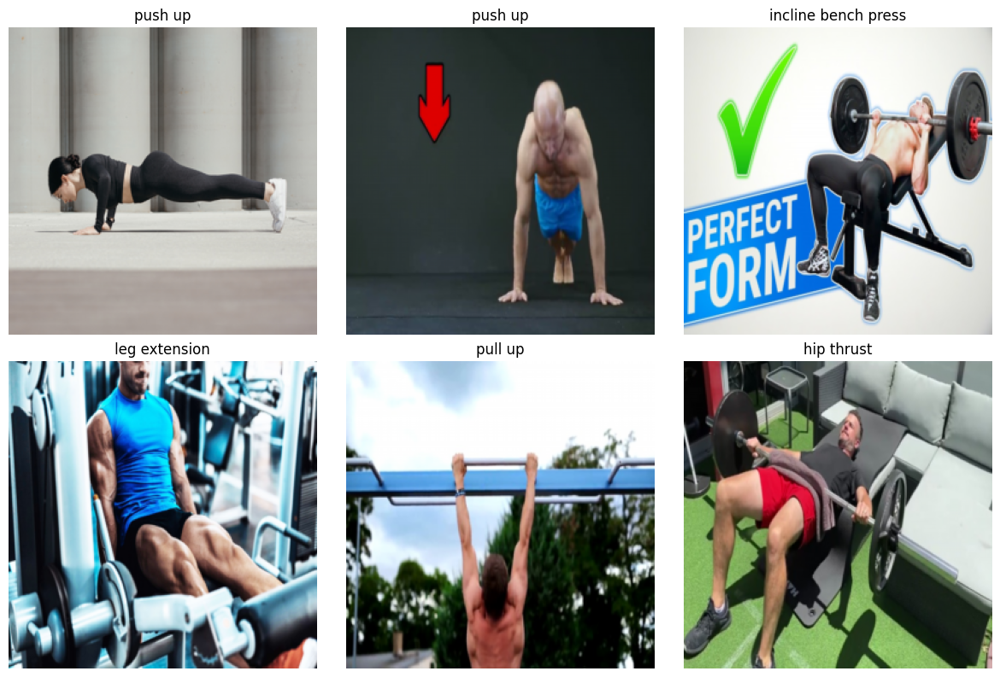

606
130
131


In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset
from torch.utils import data

image_transforms = transforms.Compose([
  transforms.ToTensor(), # convert the object into a tensor
  transforms.Resize((256, 256)), # resize the images
  ])

dataset = ImageFolder('data',
    transform=image_transforms
)

from collections import defaultdict

class_indices = defaultdict(list)

for idx, (_, label) in enumerate(dataset.samples):
    class_indices[label].append(idx)

train_idx, val_idx, test_idx = [], [], []

for label, idxs in class_indices.items():
    n = len(idxs)
    t1 = int(0.7 * n)
    t2 = int(0.85 * n)

    train_idx.extend(idxs[:t1])
    val_idx.extend(idxs[t1:t2])
    test_idx.extend(idxs[t2:])

train_dataset = Subset(dataset, train_idx)
val_dataset = Subset(dataset, val_idx)
test_dataset = Subset(dataset, test_idx)

print("Train:", count_labels(train_dataset))
print("Val:  ", count_labels(val_dataset))
print("Test: ", count_labels(test_dataset))

dataloader_train, dataloader_val, dataloader_test = create_dataloaders()

print(len(dataloader_train))
print(len(dataloader_val))
print(len(dataloader_test))

In [ ]:
from transformers import AutoImageProcessor
from transformers import SiglipForImageClassification
from tqdm import tqdm
from sklearn.metrics import f1_score, precision_score, recall_score
import pprint
from PIL import Image

model_name = "prithivMLmods/Gym-Workout-Classifier-SigLIP2"
model = SiglipForImageClassification.from_pretrained(model_name)
processor = AutoImageProcessor.from_pretrained(model_name, use_fast = True)

print(sorted(list(model.config.id2label.values())))

all_preds = []
all_labels = []

model.eval()
model.to(device)

with torch.no_grad():
    for images, labels in tqdm(dataloader_test):
        pil_images = [Image.fromarray((img.numpy().transpose(1,2,0)*255).astype('uint8'))
              for img in images]
        inputs = processor(images = pil_images, return_tensors="pt")
        labels = labels.to(device)
        inputs = {k: v.to(device) for k, v in inputs.items()}

        outputs = model(**inputs).logits
        preds = torch.argmax(outputs, dim=1)

        all_preds.append(preds.cpu())
        all_labels.append(labels.cpu())

all_preds = torch.cat(all_preds)
all_labels = torch.cat(all_labels)

f1 = f1_score(all_labels, all_preds, average='macro')
precision = precision_score(all_labels, all_preds, average='macro')
recall = recall_score(all_labels, all_preds, average='macro')

print(f"Summary statistics:")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1: {f1}")

f1_per_class = f1_score(all_labels, all_preds, average=None)
class_names = dataset.classes

f1_dict = dict(zip(class_names, f1_per_class))

pprint.pprint(f1_dict)

['barbell biceps curl', 'bench press', 'chest fly machine', 'deadlift', 'decline bench press', 'hammer curl', 'hip thrust', 'incline bench press', 'lat pulldown', 'lateral raises', 'leg extension', 'leg raises', 'plank', 'pull up', 'push up', 'romanian deadlift', 'russian twist', 'shoulder press', 'squat', 't bar row', 'tricep dips', 'tricep pushdown']


  0%|          | 0/131 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
100%|██████████| 131/131 [00:43<00:00,  2.98it/s]

Summary statistics:
Precision: 0.8664297593227173
Recall: 0.8506029580542804
F1: 0.8520573810056171
{'barbell biceps curl': np.float64(0.8325358851674641),
 'bench press': np.float64(0.7857142857142857),
 'chest fly machine': np.float64(0.8160919540229885),
 'deadlift': np.float64(0.8765432098765432),
 'decline bench press': np.float64(0.8260869565217391),
 'hammer curl': np.float64(0.7482014388489209),
 'hip thrust': np.float64(0.8641975308641975),
 'incline bench press': np.float64(0.7758620689655172),
 'lat pulldown': np.float64(0.8369565217391305),
 'lateral raises': np.float64(0.8527131782945736),
 'leg extension': np.float64(0.9444444444444444),
 'leg raises': np.float64(0.8270676691729323),
 'plank': np.float64(0.9169435215946844),
 'pull up': np.float64(0.9171270718232044),
 'push up': np.float64(0.8571428571428571),
 'romanian deadlift': np.float64(0.9655172413793104),
 'russian twist': np.float64(0.719626168224299),
 'shoulder press': np.float64(0.810126582278481),
 'squat': 

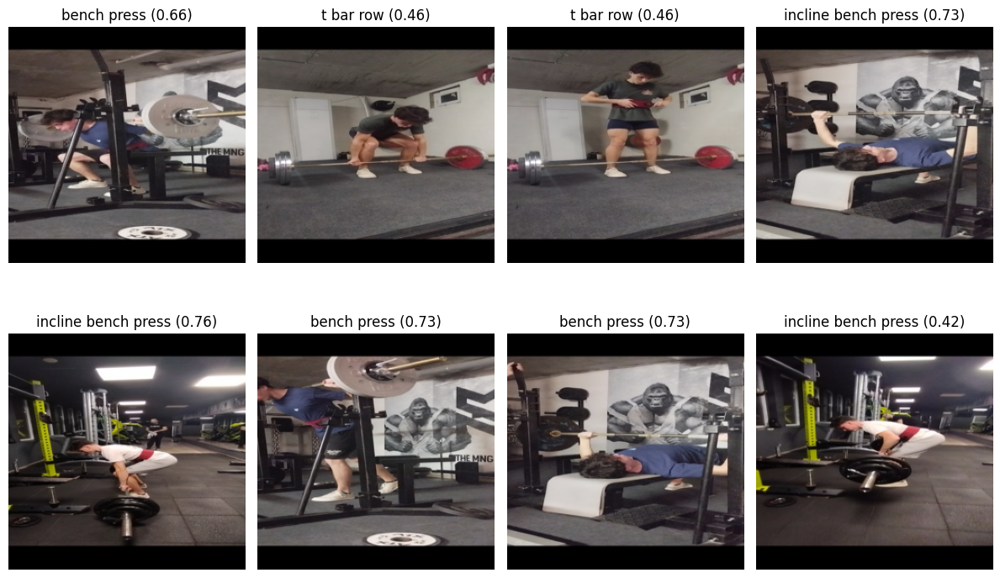

In [ ]:
from PIL import Image

my_dataset = ImageFolder('my_data',
    transform=image_transforms
)
my_loader = data.DataLoader(
      my_dataset,
      shuffle=True,
      batch_size=8,
      num_workers=4,
      pin_memory=True
  )

net = model
net.to(device)

images, _ = next(iter(my_loader))

pil_images = [Image.fromarray((img.numpy().transpose(1,2,0)*255).astype('uint8'))
              for img in images]
inputs = processor(images=pil_images, return_tensors="pt").to(device)


# inputs = processor(images = images, return_tensors="pt")

net.eval()
with torch.no_grad():
    inputs = {k: v.to(device) for k, v in inputs.items()}
    outputs = net(**inputs).logits
    probs = torch.softmax(outputs, dim=1)
    preds = torch.argmax(probs, dim=1)

images = images.cpu()
probs = probs.cpu()
preds = preds.cpu()

rows, cols = 2, 4
fig, axes = plt.subplots(rows, cols, figsize=(12, 8))


for i, ax in enumerate(axes.flat):
    img = images[i].permute(1, 2, 0)

    pred_class = class_names[preds[i]]
    confidence = probs[i][preds[i]].item()

    ax.imshow(img)
    ax.set_title(f"{pred_class} ({confidence:.2f})")
    ax.axis("off")

plt.tight_layout()
plt.show()

We see that this model makes some errors sometimes, but they are much more reasonable, eg it says t-bar row on the deadlift, which is a mistake that even a human can make. So far this is the best model, but I don't think the metric of .85 F1 score is realistic. This model was probably trained on the same dataset, since the classes match exactly and it was most probably also trained on the test data I used. That's why the F1 score is better than it should realistically be. https://huggingface.co/prithivMLmods/Gym-Workout-Classifier-SigLIP2 on this link, where I downloaded the pre-trained model from, it says that it has .96 F1 score which is even better. In my opinion this score isn't realistic and wasn't measured correctly. It was probably measured on data that the model has seen before.
To accurately and correctly measure the model's performance I should do it on a totally different dataset.

I'll try fine-tuning a pretrained VGG model myself, so that I can more accurately measure how well it performs.

In [ ]:

from torchvision import models

model = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)

This model was trained on ImageNET and thus it has 1000 classes. I have to change the last layer to have 22 outputs instead of the 1000 it has now.

In [ ]:

import torch.nn as nn

model.classifier[6] = nn.Linear(
    in_features=4096,
    out_features=22
)


Since I want to mostly use the already pretrained model and not have it overfit on my dataset, I'll freeze the first layers.

In [ ]:
for param in model.features.parameters():
    param.requires_grad = False

for param in model.features[-5:].parameters():
    param.requires_grad = True


This model takes in images that are 224x224


Train: Counter({12: 695, 9: 590, 18: 519, 7: 510, 0: 493, 20: 488, 19: 467, 8: 452, 1: 437, 21: 437, 13: 430, 14: 420, 10: 410, 6: 389, 15: 388, 5: 382, 3: 371, 2: 368, 16: 365, 4: 359, 11: 359, 17: 358})
Val:   Counter({12: 149, 9: 126, 18: 111, 7: 109, 0: 106, 20: 105, 19: 100, 8: 97, 1: 94, 21: 94, 13: 92, 14: 90, 10: 88, 6: 84, 15: 83, 5: 82, 2: 79, 3: 79, 16: 78, 4: 77, 11: 77, 17: 77})
Test:  Counter({12: 149, 9: 127, 18: 112, 7: 110, 0: 106, 20: 105, 19: 101, 8: 97, 1: 94, 21: 94, 13: 93, 14: 91, 10: 88, 6: 84, 15: 84, 5: 82, 2: 80, 3: 80, 16: 79, 4: 78, 11: 78, 17: 77})


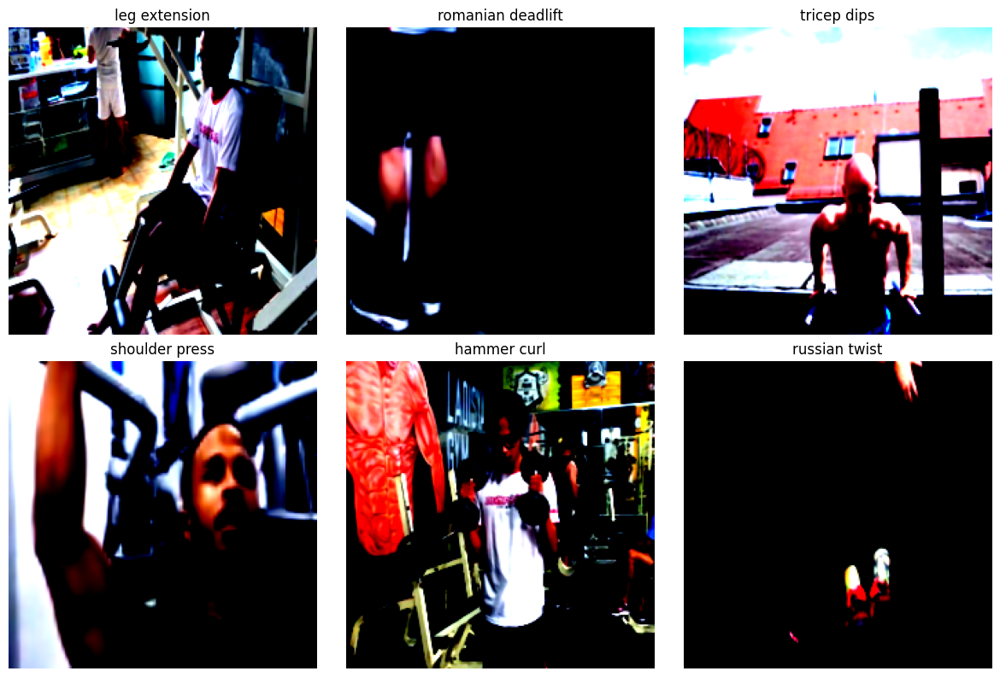

606
130
131


In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset
from torch.utils import data

image_transforms = transforms.Compose([
  transforms.RandomHorizontalFlip(), # simulate different viewpoints
#   transforms.RandomVerticalFlip(),
#   transforms.RandomRotation(45),
  transforms.ToTensor(), # convert the object into a tensor
  transforms.Resize((256, 256)), # resize the images
  transforms.RandomResizedCrop(224),
  transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
    #Normalizing the data to be zero-centered.
  #Initially I normalized it by using the
  #dataset mean and std, but I later changed it
  #to use the ImageNet normalization,
  #so that i can use the same data if i try
  #fine-tuning a model.
  ])

dataset = ImageFolder('data',
    transform=image_transforms
)

from collections import defaultdict

class_indices = defaultdict(list)

for idx, (_, label) in enumerate(dataset.samples):
    class_indices[label].append(idx)

train_idx, val_idx, test_idx = [], [], []

for label, idxs in class_indices.items():
    n = len(idxs)
    t1 = int(0.7 * n)
    t2 = int(0.85 * n)

    train_idx.extend(idxs[:t1])
    val_idx.extend(idxs[t1:t2])
    test_idx.extend(idxs[t2:])

train_dataset = Subset(dataset, train_idx)
val_dataset = Subset(dataset, val_idx)
test_dataset = Subset(dataset, test_idx)

print("Train:", count_labels(train_dataset))
print("Val:  ", count_labels(val_dataset))
print("Test: ", count_labels(test_dataset))

dataloader_train, dataloader_val, dataloader_test = create_dataloaders()

print(len(dataloader_train))
print(len(dataloader_val))
print(len(dataloader_test))

100%|██████████| 606/606 [07:27<00:00,  1.35it/s]


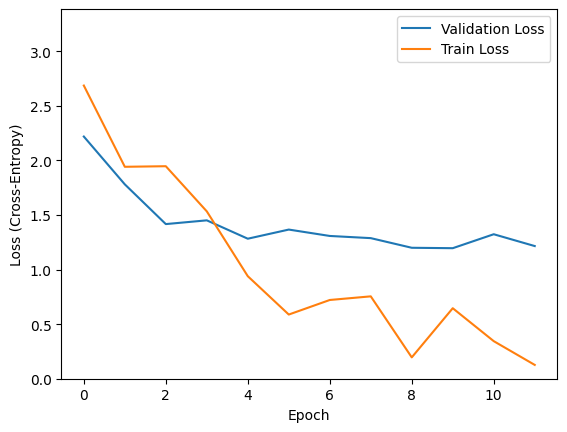

Total time taken to train the model in seconds: 447.6493730545044


In [ ]:
import torch.optim as optim
import time
import pprint
import importlib
import train_model

importlib.reload(train_model)


net = model.to(device)
learning_rate = 5e-5
optimizer = optim.AdamW(net.parameters(), lr = learning_rate)

start_time = time.time()
loss_history = train_model.train_model(dataloader_train, dataloader_val, optimizer, net, 1, device, True, print_every_50_batches=True)
end_time = time.time()

total_time_taken = end_time - start_time
print(f"Total time taken to train the model in seconds: {total_time_taken}")


In [ ]:
print_metrics()

Summary statistics:
Precision: 0.5756186877661998
Recall: 0.5287288559567013
F1: 0.5207887299863249
Total time taken to train the model in seconds: 447.6493730545044
{'barbell biceps curl': np.float64(0.5611510791366906),
 'bench press': np.float64(0.22857142857142856),
 'chest fly machine': np.float64(0.48148148148148145),
 'deadlift': np.float64(0.31351351351351353),
 'decline bench press': np.float64(0.5139664804469274),
 'hammer curl': np.float64(0.16),
 'hip thrust': np.float64(0.7121212121212122),
 'incline bench press': np.float64(0.5374449339207048),
 'lat pulldown': np.float64(0.6896551724137931),
 'lateral raises': np.float64(0.6202090592334495),
 'leg extension': np.float64(0.7317073170731707),
 'leg raises': np.float64(0.7534246575342466),
 'plank': np.float64(0.8896551724137931),
 'pull up': np.float64(0.6111111111111112),
 'push up': np.float64(0.7142857142857143),
 'romanian deadlift': np.float64(0.16822429906542055),
 'russian twist': np.float64(0.6075949367088608),
 's

In [ ]:
torch.save(net.state_dict(), "model_04.pth")

We have much better metrics on this model. But we see that on some exercises it performs better. I'll try training it with weights due to the class imbalance we have in the data.

In [ ]:

from torchvision import models

model = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)

import torch.nn as nn

model.classifier[6] = nn.Linear(
    in_features=4096,
    out_features=22
)
for param in model.features.parameters():
    param.requires_grad = False

for param in model.features[-5:].parameters():
    param.requires_grad = True



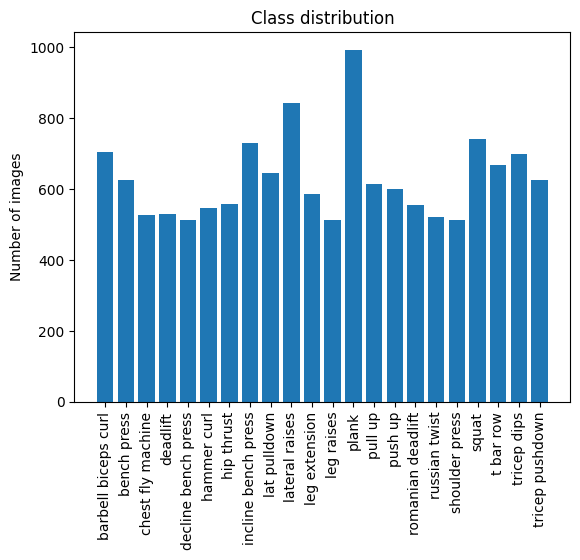

In [ ]:
plt.bar(class_names, counts)
plt.ylabel("Number of images")
plt.title("Class distribution")
plt.xticks(class_names, rotation=90)
plt.show()


In [ ]:
import numpy as np

label_counts = 1 / np.array(counts) #getting the inverse counts
#because i want the class with more count to have less weight
class_weights = label_counts / np.sum(label_counts)

print(class_weights)
print(np.sum(class_weights))


[0.03942511 0.04447152 0.05274137 0.05244284 0.0540753  0.05090605
 0.04990072 0.03812716 0.04302586 0.03297118 0.04743123 0.0540753
 0.02799064 0.04519464 0.04624743 0.05008055 0.05324656 0.05428653
 0.03745917 0.04160884 0.03982049 0.04447152]
1.0000000000000002


100%|██████████| 606/606 [07:15<00:00,  1.39it/s]


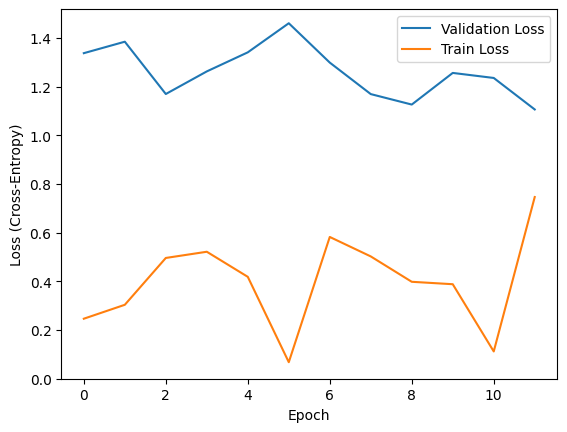

Total time taken to train the model in seconds: 435.76275086402893


In [ ]:
import torch.optim as optim
import time
import pprint
import importlib
import train_model

importlib.reload(train_model)


net = model.to(device)
learning_rate = 5e-5
optimizer = optim.AdamW(net.parameters(), lr = learning_rate)

start_time = time.time()
loss_history = train_model.train_model(dataloader_train, dataloader_val, optimizer, net, 1, device, True,class_weights=class_weights, print_every_50_batches=True)
end_time = time.time()

total_time_taken = end_time - start_time
print(f"Total time taken to train the model in seconds: {total_time_taken}")


In [ ]:
print_metrics()

Summary statistics:
Precision: 0.6286795763239046
Recall: 0.5920247929976733
F1: 0.5900936279710991
Total time taken to train the model in seconds: 435.76275086402893
{'barbell biceps curl': np.float64(0.7211538461538461),
 'bench press': np.float64(0.350597609561753),
 'chest fly machine': np.float64(0.5388127853881278),
 'deadlift': np.float64(0.4485981308411215),
 'decline bench press': np.float64(0.5396825396825397),
 'hammer curl': np.float64(0.4925373134328358),
 'hip thrust': np.float64(0.8194444444444444),
 'incline bench press': np.float64(0.5697674418604651),
 'lat pulldown': np.float64(0.7389162561576355),
 'lateral raises': np.float64(0.6212765957446809),
 'leg extension': np.float64(0.7261146496815286),
 'leg raises': np.float64(0.6171428571428571),
 'plank': np.float64(0.8590163934426229),
 'pull up': np.float64(0.7835051546391752),
 'push up': np.float64(0.6547619047619048),
 'romanian deadlift': np.float64(0.3787878787878788),
 'russian twist': np.float64(0.474358974358

The F1 score is a little better than before, but there are still classes with higher F1 score.

In [ ]:
torch.save(net.state_dict(), "model_05.pth")

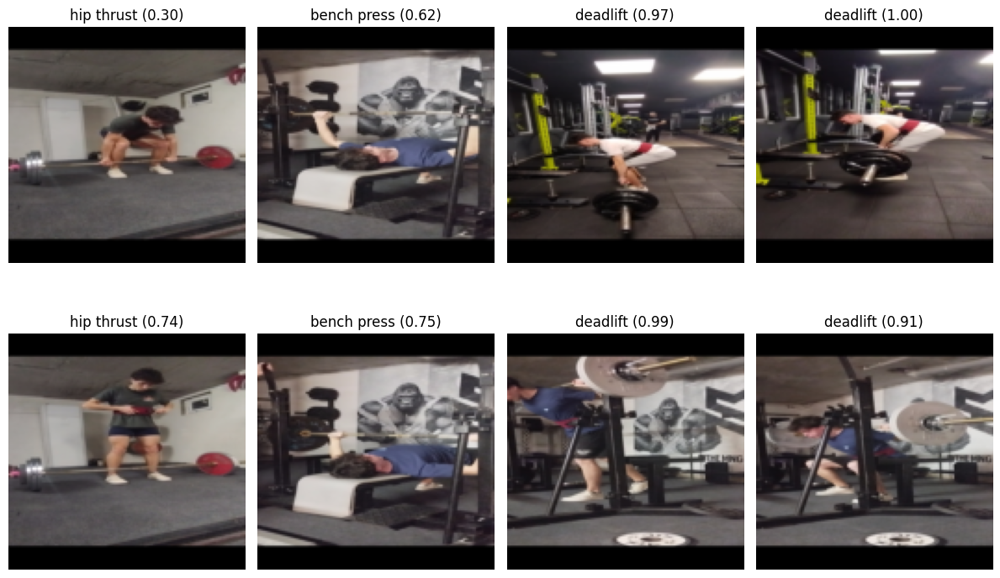

In [ ]:
test_on_my_dataset()

In [ ]:
from torchvision import models

model = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
import torch.nn as nn

model.classifier[6] = nn.Linear(
    in_features=4096,
    out_features=22
)

In [ ]:

model.load_state_dict(torch.load("model_05.pth"))

<All keys matched successfully>

  0%|          | 0/606 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
100%|██████████| 606/606 [10:34<00:00,  1.05s/it]


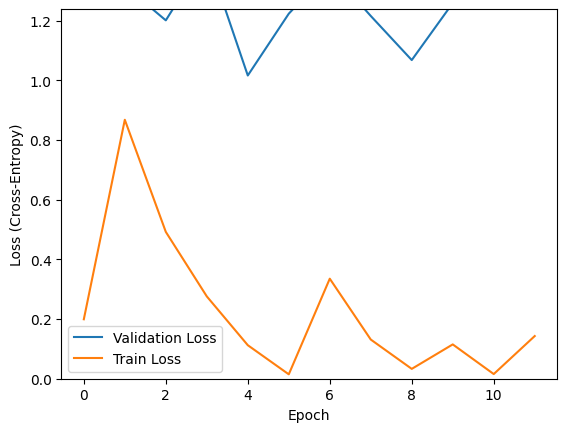

Total time taken to train the model in seconds: 634.638521194458


In [ ]:
import torch.optim as optim
import time
import pprint
import importlib
import train_model

importlib.reload(train_model)


net = model.to(device)
learning_rate = 5e-5
optimizer = optim.AdamW(net.parameters(), lr = learning_rate)

start_time = time.time()
loss_history = train_model.train_model(dataloader_train, dataloader_val, optimizer, net, 1, device, True,class_weights=class_weights, print_every_50_batches=True, save_best_model_as="model_06.pth")
end_time = time.time()

total_time_taken = end_time - start_time
print(f"Total time taken to train the model in seconds: {total_time_taken}")


In [ ]:
print_metrics()

Summary statistics:
Precision: 0.5937950638290806
Recall: 0.5472217058322131
F1: 0.536660373148834
Total time taken to train the model in seconds: 634.638521194458
{'barbell biceps curl': np.float64(0.5853658536585366),
 'bench press': np.float64(0.06451612903225806),
 'chest fly machine': np.float64(0.46048109965635736),
 'deadlift': np.float64(0.24615384615384617),
 'decline bench press': np.float64(0.518918918918919),
 'hammer curl': np.float64(0.26666666666666666),
 'hip thrust': np.float64(0.7464788732394366),
 'incline bench press': np.float64(0.496),
 'lat pulldown': np.float64(0.7657142857142857),
 'lateral raises': np.float64(0.6666666666666666),
 'leg extension': np.float64(0.7375),
 'leg raises': np.float64(0.7114093959731543),
 'plank': np.float64(0.9052631578947369),
 'pull up': np.float64(0.75),
 'push up': np.float64(0.7171717171717171),
 'romanian deadlift': np.float64(0.4897959183673469),
 'russian twist': np.float64(0.3826086956521739),
 'shoulder press': np.float64(0

we got a worse F1 score here, presumably due to everfitting, but this time I saved to model with the best validation loss. Let's see how it performs.

In [ ]:
from torchvision import models

model = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
import torch.nn as nn

model.classifier[6] = nn.Linear(
    in_features=4096,
    out_features=22
)

model.load_state_dict(torch.load("model_06.pth"))

<All keys matched successfully>

In [ ]:
net = model.to(device)
print_metrics()

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Summary statistics:
Precision: 0.6227802212159036
Recall: 0.5698283097977582
F1: 0.5715209682213325
Total time taken to train the model in seconds: 634.638521194458
{'barbell biceps curl': np.float64(0.6329113924050633),
 'bench press': np.float64(0.07936507936507936),
 'chest fly machine': np.float64(0.5685279187817259),
 'deadlift': np.float64(0.3788546255506608),
 'decline bench press': np.float64(0.4537037037037037),
 'hammer curl': np.float64(0.3014705882352941),
 'hip thrust': np.float64(0.8108108108108109),
 'incline bench press': np.float64(0.48398576512455516),
 'lat pulldown': np.float64(0.8064516129032258),
 'lateral raises': np.float64(0.6232876712328768),
 'leg extension': np.float64(0.810126582278481),
 'leg raises': np.float64(0.7819548872180451),
 'plank': np.float64(0.8872727272727273),
 'pull up': np.float64(0.8235294117647058),
 'push up': np.float64(0.6990291262135923),
 'romanian deadlift': np.float64(0.5039370078740157),
 'russian twist': np.float64(0.318840579710

Still shows signs of overfitting. Maybe we are nearing the limit of the possible achievable results, because we can see that on some really distinct exercises like plank, pull up and hip thrust where it's clear what the person is doing, the model achieves some pretty good results. But on exercises like bench press, where there are normal variation, decline and incline bench press and they are all similar between each other, it's much harder even for a human to distinguish between them.

Let's create a model report for this task of exercise classification through an image, and try to determine what model to use for the task of exercise classification through a video.

In [ ]:
import openpyxl
wb = openpyxl.Workbook()
wb.create_sheet('ModelReport')
ws = wb['ModelReport']

In [ ]:
import create_model_report
import importlib

importlib.reload(create_model_report)

y_test = [dataset.targets[i] for i in test_idx]
create_model_report.append_first_row(ws)
base_model, base_model_recall, base_model_precision, base_model_f1 = create_model_report.base_model(y_test,ws)

Now I have to load all the saved models and get their y_pred.

In [ ]:
def load_model(model_path, model_architecture, device):
    model = model_architecture.to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()
    return model

For model1 I used an incorrect method of testing, so I won't include it in the model report. Same goes for the fine-tuned SigLIP2 model that I couldn't objectively measure the F1 score of.

For some of the models, I used images with 128x128 ratio, so I need to have different dataloaders for them.

In [ ]:
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset
from torch.utils import data

image_transforms = transforms.Compose([
  transforms.RandomHorizontalFlip(), # simulate different viewpoints
#   transforms.RandomVerticalFlip(),
#   transforms.RandomRotation(45),
  transforms.ToTensor(), # convert the object into a tensor
  transforms.Resize((128, 128)), # resize the images
  transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
    #Normalizing the data to be zero-centered.
  #Initially I normalized it by using the
  #dataset mean and std, but I later changed it
  #to use the ImageNet normalization,
  #so that i can use the same data if i try
  #fine-tuning a model.
  ])

dataset = ImageFolder('data',
    transform=image_transforms
)

from collections import defaultdict

class_indices = defaultdict(list)

for idx, (_, label) in enumerate(dataset.samples):
    class_indices[label].append(idx)

train_idx, val_idx, test_idx = [], [], []

for label, idxs in class_indices.items():
    n = len(idxs)
    t1 = int(0.7 * n)
    t2 = int(0.85 * n)

    train_idx.extend(idxs[:t1])
    val_idx.extend(idxs[t1:t2])
    test_idx.extend(idxs[t2:])

train_dataset = Subset(dataset, train_idx)
val_dataset = Subset(dataset, val_idx)
test_dataset = Subset(dataset, test_idx)

print("Train:", count_labels(train_dataset))
print("Val:  ", count_labels(val_dataset))
print("Test: ", count_labels(test_dataset))

from torch.utils import data

batch_size = 16
num_workers = 8 # This is used so that while the GPU trains,
# the CPU prepares the next batch in parallel


dataloader_test_small = data.DataLoader(
    test_dataset,
    shuffle=True,
    batch_size=batch_size,
    num_workers=num_workers,
    pin_memory=True
)

Train: Counter({12: 695, 9: 590, 18: 519, 7: 510, 0: 493, 20: 488, 19: 467, 8: 452, 1: 437, 21: 437, 13: 430, 14: 420, 10: 410, 6: 389, 15: 388, 5: 382, 3: 371, 2: 368, 16: 365, 4: 359, 11: 359, 17: 358})
Val:   Counter({12: 149, 9: 126, 18: 111, 7: 109, 0: 106, 20: 105, 19: 100, 8: 97, 1: 94, 21: 94, 13: 92, 14: 90, 10: 88, 6: 84, 15: 83, 5: 82, 2: 79, 3: 79, 16: 78, 4: 77, 11: 77, 17: 77})
Test:  Counter({12: 149, 9: 127, 18: 112, 7: 110, 0: 106, 20: 105, 19: 101, 8: 97, 1: 94, 21: 94, 13: 93, 14: 91, 10: 88, 6: 84, 15: 84, 5: 82, 2: 80, 3: 80, 16: 79, 4: 78, 11: 78, 17: 77})


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [ ]:
import VGGNet
import VGGNetSmall
import VGGNetModel2
from torchvision import models
import importlib
import torch.nn as nn

importlib.reload(VGGNet)
importlib.reload(VGGNetSmall)
importlib.reload(VGGNetModel2)

vgg16 = models.vgg16(weights=None)
vgg16.classifier[6] = nn.Linear(4096, 22)

models = []
models.append(base_model)

model_structs = [

    {
        'name':'#2 Same as model1 but with metrics measured correctly',
        'path':'model_02.pth',
        'model_architecture':VGGNet.VGGNet(),
        'dataloader_test': dataloader_test_small
    },
    {
        'name':'#3 Shrinked VGG model',
        'path':'model_03.pth',
        'model_architecture':VGGNetSmall.VGGNetSmall(),
        'dataloader_test': dataloader_test_small
    },
    #In between these I tried creating models with keypoint detection
    #and tried testing a model fine-tuned on the same dataset
    {
        'name':'#4 Fine-Tuned VGG model',
        'path':'model_04.pth',
        'model_architecture':vgg16,
        'dataloader_test': dataloader_test
    },
    {
        'name':'#5 Fine-Tuned VGG model',
        'path':'model_05.pth',
        'model_architecture':vgg16,
        'dataloader_test': dataloader_test
    },
    {
        'name':'#6 Fine-Tuned VGG model',
        'path':'model_06.pth',
        'model_architecture':vgg16,
        'dataloader_test': dataloader_test
    }
]

In [ ]:
from tqdm import tqdm

for model_struct in tqdm(model_structs):
    model = load_model(model_struct['path'], model_struct['model_architecture'], device)
    to_append = {
        'name':model_struct['name'],
        'scaling':None,
        'cv':None
        }
    all_preds = []
    all_y = []

    with torch.no_grad():
        for X, y in model_struct['dataloader_test']:
            X = X.to(device)
            y = y.to(device)

            logits = model(X)
            preds = torch.argmax(logits, dim=1)

            all_preds.append(preds.cpu())
            all_y.append(y.cpu())

    y_pred = torch.cat(all_preds)
    y_test = torch.cat(all_y)
    to_append['y_pred'] = y_pred
    to_append['y'] = y_test
    models.append(to_append)

100%|██████████| 5/5 [04:24<00:00, 52.98s/it]


In [ ]:
importlib.reload(create_model_report)

for m in models:
    print(m)
    create_model_report.add_model_report_row(
        ws=ws,
        model_name=m["name"],
        y_test=m['y'],
        y_pred=m["y_pred"],
        label_names=dataset.classes,
        base_model_precision=base_model_precision,
        base_model_recall=base_model_recall,
        base_model_f1=base_model_f1,
        diagrams_dir='./diagrams',
        scaling=m["scaling"],
        cv=m["cv"],
        export_to_file=True
    )


In [ ]:
wb.save("model_report_image_classification.xlsx")

In the file "model_report_image_classification.xlsx" you can see the final evalu